In [1]:
## Preliminaries

using Pkg
Pkg.activate(joinpath(@__DIR__, ".."))

using AdvancedHMC
using ArviZ
using BumpCosmologyGWTC3
using CairoMakie
using Colors
using Cosmology
using DataFrames
using DimensionalData
using Distributions
using GaussianKDEs
using HDF5
using InferenceObjects
#using Interpolations
using JSON
using LaTeXStrings
using MCMCChainsStorage
using NCDatasets
using PairPlots
using PolyLog
using PopModels
using Printf
using ProgressLogging
using Random
using StatsBase
using SpecialFunctions
using StatsFuns
using Trapz
using Turing
using Unitful
using UnitfulAstro
using UnitfulChainRules

include("plots.jl")

  Activating project at `~/Mass_Ordering`


h_plot (generic function with 1 method)

# Plot Specification

In [2]:
## Set up paths

## Output Directory for Plots and Astro Comparison Plot
outdir = "../figures/"

## Plot Specifications
xlabelsize = 30
ylabelsize = 30
xticklabelsize = 23
yticklabelsize = 23
titlesize = 35
draws = 500

plot_save = true

true

# $p_{cut} = 0.5$

In [3]:
trace_samples_0p5 = from_netcdf(joinpath(@__DIR__, "..", "data", "chains_0.5.nc"))
ne_min = dropdims(minimum(trace_samples_0p5.posterior.Neff_samps, dims=(:chain, :draw)); dims=(:chain, :draw))
ns_min = minimum(trace_samples_0p5.posterior.Neff_sel)
@info "p_cut = 0.5, minimum Neff_samps: $(round(minimum(ne_min), digits=2)), minimum Neff_sel = $(round(ns_min, digits=1)), 4*Nobs = $(4*length(dims(trace_samples_0p5.posterior, :event)))"
trace = trace_samples_0p5

┌ Info: p_cut = 0.5, minimum Neff_samps: 4.1, minimum Neff_sel = 385.9, 4*Nobs = 240
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_W4sdnNjb2RlLXJlbW90ZQ==.jl:4


InferenceData with groups:
  > posterior
  > sample_stats

# Fig 1

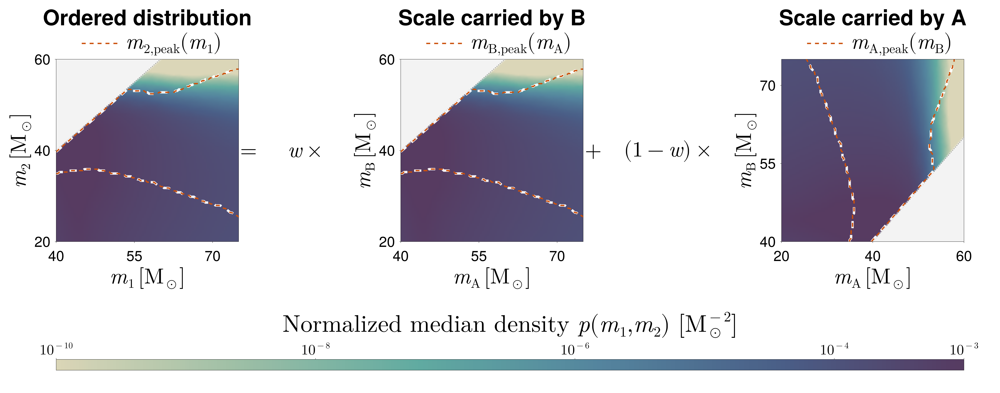

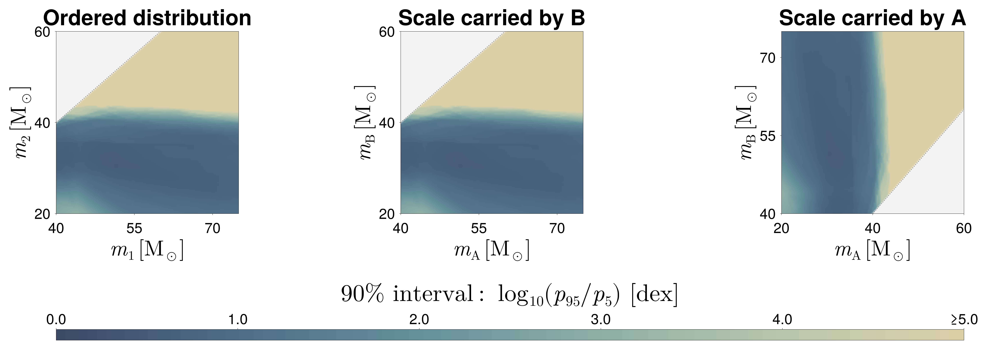

┌ Info: Normalized 500 posterior draws over 5.0 < m2 < m1 < 300.0 M_sun.
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X12sdnNjb2RlLXJlbW90ZQ==.jl:504


CairoMakie.Screen{PDF}


In [4]:
using CairoMakie
using LaTeXStrings
using ProgressLogging
using Random
using StatsBase

function highmass_model_from_draw(
    trace,
    draw_index,
    chain_index;
    fixed_mtr=nothing
)
    p = trace.posterior

    mtr_value =
        isnothing(fixed_mtr) ?
        Float64(
            p.mtr[
                draw=draw_index,
                chain=chain_index
            ]
        ) :
        Float64(fixed_mtr)

    log_population =
        BumpCosmologyGWTC3.make_log_dNdm1dqdVdt(
            Float64(
                p.alphatr[
                    draw=draw_index,
                    chain=chain_index
                ]
            ),
            Float64(
                p.alpha[
                    draw=draw_index,
                    chain=chain_index
                ]
            ),
            mtr_value,
            Float64(
                p.mu[
                    draw=draw_index,
                    chain=chain_index
                ]
            ),
            Float64(
                p.alpha_q[
                    draw=draw_index,
                    chain=chain_index
                ]
            ),
            Float64(
                p.sigma_q[
                    draw=draw_index,
                    chain=chain_index
                ]
            ),
            Float64(
                p.gamma_q[
                    draw=draw_index,
                    chain=chain_index
                ]
            ),
            Float64(
                p.lambda[
                    draw=draw_index,
                    chain=chain_index
                ]
            ),
            Float64(
                p.zp[
                    draw=draw_index,
                    chain=chain_index
                ]
            ),
            Float64(
                p.kappa[
                    draw=draw_index,
                    chain=chain_index
                ]
            );
            mlow=5.0,
            mhigh=300.0,
            m2_min=3.0
        )

    rate =
        Float64(
            p.R[
                draw=draw_index,
                chain=chain_index
            ]
        )

    return log_population, rate
end

function trapezoid_weights(grid)

    length(grid) >= 2 ||
        error(
            "At least two grid points are required."
        )

    weights = zeros(
        Float64,
        length(grid)
    )

    weights[1] =
        (grid[2] - grid[1]) / 2

    weights[end] =
        (grid[end] - grid[end - 1]) / 2

    for i in 2:(length(grid) - 1)
        weights[i] =
            (grid[i + 1] - grid[i - 1]) / 2
    end

    return weights
end

function log_weighted_integral(
    log_values,
    weights
)
    length(log_values) == length(weights) ||
        error(
            "The values and integration weights have " *
            "different lengths."
        )

    valid = (
        isfinite.(log_values) .&
        isfinite.(weights) .&
        (weights .> 0.0)
    )

    any(valid) ||
        return -Inf

    maximum_log_value =
        maximum(
            log_values[valid]
        )

    scaled_integral = sum(
        weights[valid] .*
        exp.(
            log_values[valid] .-
            maximum_log_value
        )
    )

    if !(
        isfinite(scaled_integral) &&
        scaled_integral > 0.0
    )
        return -Inf
    end

    return (
        maximum_log_value +
        log(scaled_integral)
    )
end

function full_mass_log_normalization(
    log_population,
    z_plot;
    mass_min=5.0,
    mass_max=300.0,
    normalization_Nm1=240,
    normalization_Nq=160
)
    mass_min > 0.0 ||
        error(
            "mass_min must be positive."
        )

    mass_max > mass_min ||
        error(
            "mass_max must exceed mass_min."
        )

    normalization_Nm1 >= 2 ||
        error(
            "normalization_Nm1 must be at least 2."
        )

    normalization_Nq >= 2 ||
        error(
            "normalization_Nq must be at least 2."
        )

    normalization_m1_grid = collect(
        range(
            mass_min,
            mass_max,
            length=normalization_Nm1
        )
    )

    m1_weights =
        trapezoid_weights(
            normalization_m1_grid
        )

    log_q_integrals = fill(
        -Inf,
        normalization_Nm1
    )

    for i in eachindex(normalization_m1_grid)

        m1 =
            normalization_m1_grid[i]

        q_min =
            mass_min / m1

        q_min >= 1.0 &&
            continue

        q_grid = collect(
            range(
                q_min,
                1.0,
                length=normalization_Nq
            )
        )

        q_weights =
            trapezoid_weights(
                q_grid
            )

        log_values = fill(
            -Inf,
            normalization_Nq
        )

        for j in eachindex(q_grid)

            value =
                log_population(
                    m1,
                    q_grid[j],
                    z_plot
                )

            if isfinite(value)
                log_values[j] =
                    value
            end
        end

        log_q_integrals[i] =
            log_weighted_integral(
                log_values,
                q_weights
            )
    end

    log_normalization =
        log_weighted_integral(
            log_q_integrals,
            m1_weights
        )

    isfinite(log_normalization) ||
        error(
            "Could not normalize the population over " *
            "5 < m2 < m1 < 300 M_sun."
        )

    return log_normalization
end

function ordering_degeneracy_plot(
    trace;
    m1_min=40.0,
    m2_min=20.0,
    mmax=75.0,
    m2_display_max=60.0,
    Nm1=111,
    z_plot=0.2,
    ndraws=500,
    fixed_mtr=nothing,
    rng=MersenneTwister(1701),
    normalization_mass_min=5.0,
    normalization_mass_max=300.0,
    normalization_Nm1=240,
    normalization_Nq=160,
    distribution_color_min=1.0e-10,
    distribution_color_max=1.0e-3,
    uncertainty_color_max=5.0,
    font_size=60
)
    p = trace.posterior

    m1_grid = collect(
        range(
            m1_min,
            mmax,
            length=Nm1
        )
    )

    grid_step =
        (mmax - m1_min) /
        (Nm1 - 1)

    Nm2 =
        round(
            Int,
            (mmax - m2_min) / grid_step
        ) + 1

    m2_grid = collect(
        range(
            m2_min,
            mmax,
            length=Nm2
        )
    )

    number_m1 =
        length(m1_grid)

    number_m2 =
        length(m2_grid)

    ordered_plot_mask = [
        m2 <= m1
        for m1 in m1_grid,
            m2 in m2_grid
    ]

    chain_indices = collect(
        span(
            dims(
                p,
                :chain
            )
        )
    )

    draw_indices = collect(
        span(
            dims(
                p,
                :draw
            )
        )
    )

    posterior_pairs = [
        (
            chain_index,
            draw_index
        )
        for chain_index in chain_indices
        for draw_index in draw_indices
    ]

    number_to_use = min(
        ndraws,
        length(posterior_pairs)
    )

    selected_pairs = sample(
        rng,
        posterior_pairs,
        number_to_use;
        replace=false
    )

    log_distribution_draws = fill(
        NaN,
        number_m1,
        number_m2,
        number_to_use
    )

    ridge_draws = fill(
        NaN,
        number_m1,
        number_to_use
    )

    log_normalizations = fill(
        NaN,
        number_to_use
    )

    @progress for sample_index in eachindex(selected_pairs)

        chain_index, draw_index =
            selected_pairs[sample_index]

        log_population, _ =
            highmass_model_from_draw(
                trace,
                draw_index,
                chain_index;
                fixed_mtr=fixed_mtr
            )

        log_normalization =
            full_mass_log_normalization(
                log_population,
                z_plot;
                mass_min=
                    normalization_mass_min,
                mass_max=
                    normalization_mass_max,
                normalization_Nm1=
                    normalization_Nm1,
                normalization_Nq=
                    normalization_Nq
            )

        log_normalizations[sample_index] =
            log_normalization


        current_log_distribution = view(
            log_distribution_draws,
            :,
            :,
            sample_index
        )

        for i in eachindex(m1_grid)

            m1 =
                m1_grid[i]

            for j in eachindex(m2_grid)

                ordered_plot_mask[i, j] ||
                    continue

                m2 =
                    m2_grid[j]

                q =
                    m2 / m1

                log_density =
                    log_population(
                        m1,
                        q,
                        z_plot
                    ) -
                    log(m1) -
                    log_normalization

                if isfinite(log_density)
                    current_log_distribution[
                        i,
                        j
                    ] =
                        log_density
                end
            end

            valid_indices = findall(
                ordered_plot_mask[i, :] .&
                isfinite.(
                    current_log_distribution[i, :]
                )
            )

            isempty(valid_indices) &&
                continue

            peak_local_index = argmax(
                current_log_distribution[
                    i,
                    valid_indices
                ]
            )

            peak_grid_index =
                valid_indices[peak_local_index]

            ridge_draws[
                i,
                sample_index
            ] =
                m2_grid[peak_grid_index]
        end
    end


    any(isfinite.(log_normalizations)) ||
        error(
            "No posterior draws were successfully normalized."
        )

    @info(
        "Normalized $(count(isfinite, log_normalizations)) " *
        "posterior draws over " *
        "$(normalization_mass_min) < m2 < m1 < " *
        "$(normalization_mass_max) M_sun."
    )

    median_log_distribution = fill(
        NaN,
        number_m1,
        number_m2
    )

    log_distribution_5 = fill(
        NaN,
        number_m1,
        number_m2
    )

    log_distribution_95 = fill(
        NaN,
        number_m1,
        number_m2
    )

    distribution_uncertainty = fill(
        NaN,
        number_m1,
        number_m2
    )

    for i in eachindex(m1_grid)
        for j in eachindex(m2_grid)

            ordered_plot_mask[i, j] ||
                continue

            values = collect(
                view(
                    log_distribution_draws,
                    i,
                    j,
                    :
                )
            )

            finite_values = filter(
                isfinite,
                values
            )

            isempty(finite_values) &&
                continue

            credible_interval = quantile(
                finite_values,
                [
                    0.05,
                    0.50,
                    0.95
                ]
            )

            log_distribution_5[i, j] =
                credible_interval[1]

            median_log_distribution[i, j] =
                credible_interval[2]

            log_distribution_95[i, j] =
                credible_interval[3]

            distribution_uncertainty[i, j] =
                (
                    log_distribution_95[i, j] -
                    log_distribution_5[i, j]
                ) /
                log(10.0)
        end
    end

    median_distribution = map(
        median_log_distribution
    ) do value
        isfinite(value) ?
            exp(value) :
            NaN
    end

    displayed_uncertainty = map(
        distribution_uncertainty
    ) do value

        if isfinite(value)
            min(
                value,
                uncertainty_color_max
            )
        else
            NaN
        end
    end

    # Uncertainty

    ridge_median = fill(
        NaN,
        number_m1
    )

    ridge_low = fill(
        NaN,
        number_m1
    )

    ridge_high = fill(
        NaN,
        number_m1
    )

    for i in eachindex(m1_grid)

        ridge_values = collect(
            view(
                ridge_draws,
                i,
                :
            )
        )

        finite_ridge_values = filter(
            isfinite,
            ridge_values
        )

        isempty(finite_ridge_values) &&
            continue

        credible_interval = quantile(
            finite_ridge_values,
            [
                0.05,
                0.50,
                0.95
            ]
        )

        ridge_low[i] =
            credible_interval[1]

        ridge_median[i] =
            credible_interval[2]

        ridge_high[i] =
            credible_interval[3]
    end

    distribution_color_min <= 0.0 &&
        error(
            "distribution_color_min must be positive."
        )

    distribution_color_max <=
        distribution_color_min &&
        error(
            "distribution_color_max must exceed " *
            "distribution_color_min."
        )

    uncertainty_color_max <= 0.0 &&
        error(
            "uncertainty_color_max must be positive."
        )

    distribution_tick_values = [
        1.0e-10,
        1.0e-8,
        1.0e-6,
        1.0e-4,
        1.0e-3
    ]

    distribution_tick_labels = [
        L"10^{-10}",
        L"10^{-8}",
        L"10^{-6}",
        L"10^{-4}",
        L"10^{-3}"
    ]

    uncertainty_tick_values = collect(
        range(
            0.0,
            uncertainty_color_max,
            length=6
        )
    )

    uncertainty_tick_labels = string.(
        round.(
            uncertainty_tick_values;
            digits=1
        )
    )

    uncertainty_tick_labels[end] =
        "≥" *
        uncertainty_tick_labels[end]


    distribution_colormap = cgrad(
        [
            RGBf(0.86, 0.84, 0.72),
            RGBf(0.62, 0.75, 0.65),
            RGBf(0.38, 0.67, 0.63),
            RGBf(0.33, 0.52, 0.62),
            RGBf(0.29, 0.37, 0.53),
            RGBf(0.34, 0.23, 0.38)
        ]
    )

    uncertainty_colormap = cgrad(
        [
            RGBf(0.24, 0.29, 0.40),
            RGBf(0.31, 0.43, 0.53),
            RGBf(0.40, 0.57, 0.61),
            RGBf(0.56, 0.69, 0.65),
            RGBf(0.73, 0.78, 0.68),
            RGBf(0.86, 0.82, 0.66)
        ]
    )

    title_font_size =
        90

    axis_label_font_size =
        90

    tick_font_size =
        font_size

    legend_font_size =
        axis_label_font_size

    equation_font_size =
        90

    colorbar_label_font_size =
        100

    colorbar_tick_font_size =
        60

    high_mass_ticks = [
        40.0,
        55.0,
        70.0
    ]

    low_mass_ticks = [
        20.0,
        40.0,
        60.0
    ]

    peak_line_color = RGBf(
        0.80,
        0.32,
        0.05
    )

    peak_outline_color = RGBAf(
        1.0,
        1.0,
        1.0,
        0.92
    )

    peak_line_width =
        5.5

    peak_outline_width =
        10.0

    common_axis_options = (
        xgridvisible=false,
        ygridvisible=false,

        backgroundcolor=RGBf(
            0.95,
            0.95,
            0.95
        ),

        xlabelsize=
            axis_label_font_size,

        ylabelsize=
            axis_label_font_size,

        xticklabelsize=
            tick_font_size,

        yticklabelsize=
            tick_font_size,

        xlabelpadding=8,
        ylabelpadding=8,

        xticklabelpad=18,
        yticklabelpad=18,

        aspect=1
    )

    equal_mass_values = [
        m1_min,
        m2_display_max
    ]

    function draw_peak_legend!(
        legend_position,
        legend_label
    )
        legend_axis = Axis(
            legend_position;
            backgroundcolor=:transparent
        )

        hidedecorations!(
            legend_axis
        )

        hidespines!(
            legend_axis
        )

        xlims!(
            legend_axis,
            0.0,
            1.0
        )

        ylims!(
            legend_axis,
            0.0,
            1.0
        )

        lines!(
            legend_axis,
            [0.14, 0.34],
            [0.50, 0.50];
            color=peak_outline_color,
            linewidth=peak_outline_width,
            linestyle=:dash
        )

        lines!(
            legend_axis,
            [0.14, 0.34],
            [0.50, 0.50];
            color=peak_line_color,
            linewidth=peak_line_width,
            linestyle=:dash
        )

        text!(
            legend_axis,
            0.38,
            0.50;
            text=legend_label,
            fontsize=legend_font_size,
            align=(
                :left,
                :center
            ),
            color=:black
        )

        return nothing
    end

    function draw_peak_bounds!(
        axis,
        lower_x,
        lower_y,
        upper_x,
        upper_y
    )
        lines!(
            axis,
            lower_x,
            lower_y;
            color=peak_outline_color,
            linewidth=peak_outline_width,
            linestyle=:dash
        )

        lines!(
            axis,
            upper_x,
            upper_y;
            color=peak_outline_color,
            linewidth=peak_outline_width,
            linestyle=:dash
        )

        lines!(
            axis,
            lower_x,
            lower_y;
            color=peak_line_color,
            linewidth=peak_line_width,
            linestyle=:dash
        )

        lines!(
            axis,
            upper_x,
            upper_y;
            color=peak_line_color,
            linewidth=peak_line_width,
            linestyle=:dash
        )

        return nothing
    end

    function make_three_panel_figure(
        plotted_data;
        colormap,
        colorrange,
        colorbar_ticks,
        colorbar_label,
        logarithmic=false,
        show_peak_lines=false
    )
        axis_row =
            show_peak_lines ? 3 : 2

        colorbar_row =
            axis_row + 1

        figure_height =
            show_peak_lines ? 1180 : 1050

        figure = Figure(
            size=(
                3600,
                figure_height
            ),
            fontsize=font_size,
            backgroundcolor=:white,
            figure_padding=(
                35,
                150,
                30,
                30
            )
        )

        Label(
            figure[1, 1],
            "Ordered distribution";
            fontsize=title_font_size,
            font=:bold,
            tellwidth=false
        )

        Label(
            figure[1, 4],
            "Scale carried by B";
            fontsize=title_font_size,
            font=:bold,
            tellwidth=false
        )

        Label(
            figure[1, 7],
            "Scale carried by A";
            fontsize=title_font_size,
            font=:bold,
            tellwidth=false
        )


        # ----------------------------------------------------
        # Axes
        # ----------------------------------------------------

        axis_ordered = Axis(
            figure[axis_row, 1];
            common_axis_options...,

            limits=(
                m1_min,
                mmax,
                m2_min,
                m2_display_max
            ),

            xticks=
                high_mass_ticks,

            yticks=
                low_mass_ticks,

            xlabel=
                L"m_1\,[\mathrm{M}_{\odot}]",

            ylabel=
                L"m_2\,[\mathrm{M}_{\odot}]"
        )

        axis_B = Axis(
            figure[axis_row, 4];
            common_axis_options...,

            limits=(
                m1_min,
                mmax,
                m2_min,
                m2_display_max
            ),

            xticks=
                high_mass_ticks,

            yticks=
                low_mass_ticks,

            xlabel=
                L"m_{\mathrm{A}}\,[\mathrm{M}_{\odot}]",

            ylabel=
                L"m_{\mathrm{B}}\,[\mathrm{M}_{\odot}]"
        )

        axis_A = Axis(
            figure[axis_row, 7];
            common_axis_options...,

            limits=(
                m2_min,
                m2_display_max,
                m1_min,
                mmax
            ),

            xticks=
                low_mass_ticks,

            yticks=
                high_mass_ticks,

            xlabel=
                L"m_{\mathrm{A}}\,[\mathrm{M}_{\odot}]",

            ylabel=
                L"m_{\mathrm{B}}\,[\mathrm{M}_{\odot}]"
        )

        common_heatmap_options = (
            colormap=colormap,
            colorrange=colorrange,
            interpolate=true
        )

        if logarithmic

            heatmap_ordered = heatmap!(
                axis_ordered,
                m1_grid,
                m2_grid,
                plotted_data;
                common_heatmap_options...,
                colorscale=log10
            )

            heatmap!(
                axis_B,
                m1_grid,
                m2_grid,
                plotted_data;
                common_heatmap_options...,
                colorscale=log10
            )

            heatmap!(
                axis_A,
                m2_grid,
                m1_grid,
                permutedims(plotted_data);
                common_heatmap_options...,
                colorscale=log10
            )

        else

            heatmap_ordered = heatmap!(
                axis_ordered,
                m1_grid,
                m2_grid,
                plotted_data;
                common_heatmap_options...
            )

            heatmap!(
                axis_B,
                m1_grid,
                m2_grid,
                plotted_data;
                common_heatmap_options...
            )

            heatmap!(
                axis_A,
                m2_grid,
                m1_grid,
                permutedims(plotted_data);
                common_heatmap_options...
            )
        end

        lines!(
            axis_ordered,
            equal_mass_values,
            equal_mass_values;
            color=(:black, 0.45),
            linewidth=3,
            linestyle=:dot
        )

        lines!(
            axis_B,
            equal_mass_values,
            equal_mass_values;
            color=(:black, 0.45),
            linewidth=3,
            linestyle=:dot
        )

        lines!(
            axis_A,
            equal_mass_values,
            equal_mass_values;
            color=(:black, 0.45),
            linewidth=3,
            linestyle=:dot
        )

        if show_peak_lines

            draw_peak_bounds!(
                axis_ordered,
                m1_grid,
                ridge_low,
                m1_grid,
                ridge_high
            )

            draw_peak_bounds!(
                axis_B,
                m1_grid,
                ridge_low,
                m1_grid,
                ridge_high
            )

            draw_peak_bounds!(
                axis_A,
                ridge_low,
                m1_grid,
                ridge_high,
                m1_grid
            )

            draw_peak_legend!(
                figure[2, 1],
                L"m_{2,\mathrm{peak}}(m_1)"
            )

            draw_peak_legend!(
                figure[2, 4],
                L"m_{\mathrm{B},\mathrm{peak}}(m_{\mathrm{A}})"
            )

            draw_peak_legend!(
                figure[2, 7],
                L"m_{\mathrm{A},\mathrm{peak}}(m_{\mathrm{B}})"
            )
        end

        if show_peak_lines

            Label(
                figure[axis_row, 2],
                L"=";
                fontsize=equation_font_size,
                tellwidth=false
            )

            Label(
                figure[axis_row, 3],
                L"w \times";
                fontsize=equation_font_size,
                tellwidth=false
            )

            Label(
                figure[axis_row, 5],
                L"+";
                fontsize=equation_font_size,
                tellwidth=false
            )

            Label(
                figure[axis_row, 6],
                L"(1-w)\times";
                fontsize=equation_font_size,
                tellwidth=false
            )
        end

        colsize!(
            figure.layout,
            1,
            Fixed(760)
        )

        colsize!(
            figure.layout,
            2,
            Fixed(75)
        )

        colsize!(
            figure.layout,
            3,
            Fixed(390)
        )

        colsize!(
            figure.layout,
            4,
            Fixed(760)
        )

        colsize!(
            figure.layout,
            5,
            Fixed(75)
        )

        colsize!(
            figure.layout,
            6,
            Fixed(540)
        )

        colsize!(
            figure.layout,
            7,
            Fixed(760)
        )

        colgap!(
            figure.layout,
            4
        )

        rowgap!(
            figure.layout,
            16
        )

        rowsize!(
            figure.layout,
            1,
            Fixed(85)
        )

        if show_peak_lines
            rowsize!(
                figure.layout,
                2,
                Fixed(100)
            )
        end

        rowsize!(
            figure.layout,
            axis_row,
            Fixed(760)
        )

        colorbar_layout =
            GridLayout()

        figure[colorbar_row, 1:7] =
            colorbar_layout

        Colorbar(
            colorbar_layout[1, 1],
            heatmap_ordered;

            vertical=false,
            height=45,
            flipaxis=true,

            ticks=
                colorbar_ticks,

            label=
                colorbar_label,

            labelsize=
                colorbar_label_font_size,

            ticklabelsize=
                colorbar_tick_font_size,

            labelpadding=8
        )

        rowsize!(
            figure.layout,
            colorbar_row,
            Fixed(175)
        )

        resize_to_layout!(
            figure
        )

        return figure
    end

    median_figure = make_three_panel_figure(
        median_distribution;

        colormap=
            distribution_colormap,

        colorrange=(
            distribution_color_min,
            distribution_color_max
        ),

        colorbar_ticks=(
            distribution_tick_values,
            distribution_tick_labels
        ),

        colorbar_label=
            L"\mathrm{Normalized\ median\ density}\ p(m_1,m_2)\ [\mathrm{M}_{\odot}^{-2}]",

        logarithmic=true,
        show_peak_lines=true
    )

    uncertainty_figure = make_three_panel_figure(
        displayed_uncertainty;

        colormap=
            uncertainty_colormap,

        colorrange=(
            0.0,
            uncertainty_color_max
        ),

        colorbar_ticks=(
            uncertainty_tick_values,
            uncertainty_tick_labels
        ),

        colorbar_label=
            L"\mathrm{90%\ interval:}\ \log_{10}(p_{95}/p_{5})\ [\mathrm{dex}]",

        logarithmic=false,
        show_peak_lines=false
    )

    return (
        figure=
            median_figure,

        uncertainty_figure=
            uncertainty_figure,

        m1_grid=
            m1_grid,

        m2_grid=
            m2_grid,

        median_distribution=
            median_distribution,

        distribution_uncertainty=
            distribution_uncertainty,

        displayed_uncertainty=
            displayed_uncertainty,

        ridge_median=
            ridge_median,

        ridge_low=
            ridge_low,

        ridge_high=
            ridge_high,

        ridge_draws=
            ridge_draws,

        log_normalizations=
            log_normalizations,

        normalization_region=(
            m2_min=
                normalization_mass_min,

            m1_min=
                normalization_mass_min,

            m1_max=
                normalization_mass_max
        ),

        distribution_colorrange=(
            distribution_color_min,
            distribution_color_max
        ),

        uncertainty_colorrange=(
            0.0,
            uncertainty_color_max
        )
    )
end

fig2_result = ordering_degeneracy_plot(
    trace;

    m1_min=40.0,
    m2_min=20.0,
    mmax=75.0,
    m2_display_max=60.0,

    Nm1=111,
    z_plot=0.2,
    ndraws=draws,

    fixed_mtr=nothing,

    normalization_mass_min=5.0,
    normalization_mass_max=300.0,

    # Increase for a more accurate but slower integral
    normalization_Nm1=240,
    normalization_Nq=160,

    distribution_color_min=1.0e-10,
    distribution_color_max=1.0e-3,

    uncertainty_color_max=5.0,
    font_size=60
)

fig2 =
    fig2_result.figure

fig2_uncertainty =
    fig2_result.uncertainty_figure

display(fig2)
display(fig2_uncertainty)

if plot_save

    mkpath(outdir)

    save(
        joinpath(
            outdir,
            "Fig1_ordering_degeneracy.pdf"
        ),
        fig2
    )
    
end

# Fig 2

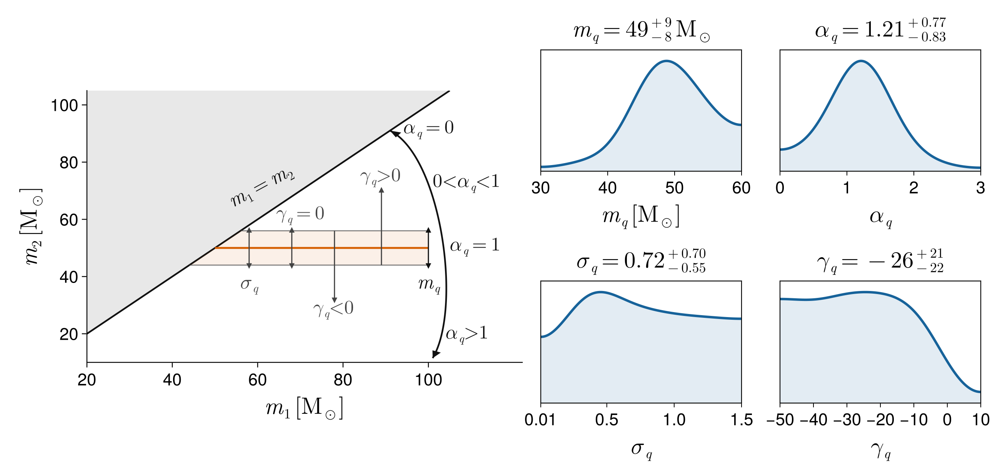

In [5]:
using CairoMakie
using KernelDensity
using Distributions
using Statistics
using Printf
using LaTeXStrings
using Colors

base_fontsize       = 19
axis_labelsize      = 30
tick_labelsize      = 22
marginal_titlesize  = 30
schematic_textsize  = 25

xlabel_padding      = 8
ylabel_padding      = 8
marginal_titlegap   = 8

horizontal_gap      = 24
vertical_gap        = 24

figure_width  = 1300
figure_height = 620

posterior_linewidth = 3.2
schematic_linewidth = 2.2
ridge_linewidth     = 2.5
arrow_linewidth     = 1.5
arrow_markersize    = 10

posterior = [
    (
        name   = :mq,
        values = vec(trace[:posterior][:mu]),
        label  = L"m_q\,[\mathrm{M}_{\odot}]",
        limits = (30.0, 60.0)
    ),
    (
        name   = :alpha_q,
        values = vec(trace[:posterior][:alpha_q]),
        label  = L"\alpha_q",
        limits = (0.0, 3.0)
    ),
    (
        name   = :sigma_q,
        values = vec(trace[:posterior][:sigma_q]),
        label  = L"\sigma_q",
        limits = (0.01, 1.5)
    ),
    (
        name   = :gamma_q,
        values = vec(trace[:posterior][:gamma_q]),
        label  = L"\gamma_q",
        limits = (-50.0, 10.0)
    )
]

nsamples = length(posterior[1].values)
finite_mask = trues(nsamples)

for p in posterior
    finite_mask .&= isfinite.(p.values)
end

posterior = [
    merge(
        p,
        (values = Float64.(p.values[finite_mask]),)
    )
    for p in posterior
]

function reflected_kde_1d(samples, limits; ngrid=300)
    lo, hi = limits

    augmented = vcat(
        samples,
        2lo .- samples,
        2hi .- samples
    )

    estimate = kde(
        augmented;
        npoints=ngrid
    )

    interpolated = InterpKDE(estimate)

    grid = collect(
        range(lo, hi; length=ngrid)
    )

    density_values = pdf.(
        Ref(interpolated),
        grid
    )

    normalization = sum(
        0.5 .* (
            density_values[1:end-1] .+
            density_values[2:end]
        ) .* diff(grid)
    )

    density_values ./= normalization

    return grid, density_values
end

function posterior_title(name, samples)
    q05, q50, q95 = quantile(
        samples,
        [0.05, 0.50, 0.95]
    )

    upper = q95 - q50
    lower = q50 - q05

    parameter_symbol = if name == :mq
        raw"m_q"
    elseif name == :alpha_q
        raw"\alpha_q"
    elseif name == :sigma_q
        raw"\sigma_q"
    elseif name == :gamma_q
        raw"\gamma_q"
    else
        string(name)
    end

    value_string = if name == :mq || name == :gamma_q
        @sprintf(
            "%.0f^{+%.0f}_{-%.0f}",
            q50,
            upper,
            lower
        )
    else
        @sprintf(
            "%.2f^{+%.2f}_{-%.2f}",
            q50,
            upper,
            lower
        )
    end

    if name == :mq
        return latexstring(
            parameter_symbol,
            " = ",
            value_string,
            raw"\,\mathrm{M}_{\odot}"
        )
    else
        return latexstring(
            parameter_symbol,
            " = ",
            value_string
        )
    end
end

set_theme!(
    Theme(
        font = "CMU Serif",
        fontsize = base_fontsize,
        Axis = (
            xgridvisible = false,
            ygridvisible = false,
            topspinevisible = true,
            rightspinevisible = true,
            spinewidth = 1.1,
            xticksize = 5,
            yticksize = 5,
            xtickwidth = 1.0,
            ytickwidth = 1.0
        )
    )
)

posterior_color = colorant"#17639A"

fig = Figure(
    size = (
        figure_width,
        figure_height
    ),
    backgroundcolor = :white,
    figure_padding = (25, 25, 20, 20)
)

marginal_positions = [
    (1, 2),  # mq
    (1, 3),  # alpha_q
    (2, 2),  # sigma_q
    (2, 3)   # gamma_q
]


for (parameter, position) in zip(
    posterior,
    marginal_positions
)
    row, col = position

    parameter_xticks = if parameter.name == :sigma_q
        (
            [0.01, 0.5, 1.0, 1.5],
            ["0.01", "0.5", "1.0", "1.5"]
        )
    else
        WilkinsonTicks(3)
    end

    ax = Axis(
        fig[row, col],
        xlabel = parameter.label,
        xlabelsize = axis_labelsize,
        xlabelpadding = xlabel_padding,
        xticklabelsize = tick_labelsize,
        xticks = parameter_xticks,
        xgridvisible = false,
        ygridvisible = false,
        topspinevisible = true,
        rightspinevisible = true,
        spinewidth = 1.1
    )

    grid, posterior_density = reflected_kde_1d(
        parameter.values,
        parameter.limits
    )

    lines!(
        ax,
        grid,
        posterior_density;
        color = posterior_color,
        linewidth = posterior_linewidth
    )

    band!(
        ax,
        grid,
        zeros(length(grid)),
        posterior_density;
        color = (posterior_color, 0.12)
    )

    ax.title = posterior_title(
        parameter.name,
        parameter.values
    )

    ax.titlesize = marginal_titlesize
    ax.titlegap = marginal_titlegap

    xlims!(
        ax,
        parameter.limits...
    )

    ylims!(
        ax,
        0,
        1.10 * maximum(posterior_density)
    )

    hideydecorations!(
        ax;
        grid=false
    )
end

schematic_black    = colorant"#111111"
schematic_darkgray = colorant"#444444"
schematic_gray     = colorant"#E8E8E8"
schematic_orange   = colorant"#D55E00"

schematic_mq = 50.0

function schematic_vertical_arrow!(
    ax,
    x,
    ystart,
    yend;
    color=schematic_darkgray,
    linewidth=arrow_linewidth,
    arrowsize=arrow_markersize,
    both=false
)
    lines!(
        ax,
        [x, x],
        [ystart, yend];
        color=color,
        linewidth=linewidth
    )

    if yend > ystart
        scatter!(
            ax,
            [x],
            [yend];
            marker=:utriangle,
            markersize=arrowsize,
            color=color
        )

        if both
            scatter!(
                ax,
                [x],
                [ystart];
                marker=:dtriangle,
                markersize=arrowsize,
                color=color
            )
        end
    else
        scatter!(
            ax,
            [x],
            [yend];
            marker=:dtriangle,
            markersize=arrowsize,
            color=color
        )

        if both
            scatter!(
                ax,
                [x],
                [ystart];
                marker=:utriangle,
                markersize=arrowsize,
                color=color
            )
        end
    end
end


function schematic_arrowhead!(
    ax,
    tip::Point2f,
    direction::Point2f;
    length=2.5,
    width=2.1,
    color=schematic_black
)
    direction_norm = sqrt(
        direction[1]^2 +
        direction[2]^2
    )

    ux = direction[1] / direction_norm
    uy = direction[2] / direction_norm

    px = -uy
    py = ux

    base_x = tip[1] - length * ux
    base_y = tip[2] - length * uy

    left = Point2f(
        base_x + 0.5 * width * px,
        base_y + 0.5 * width * py
    )

    right = Point2f(
        base_x - 0.5 * width * px,
        base_y - 0.5 * width * py
    )

    poly!(
        ax,
        Point2f[
            tip,
            left,
            right
        ];
        color=color,
        strokewidth=0
    )
end

schematic_ax = Axis(
    fig[1:2, 1],
    xlabel = L"m_1\,[\mathrm{M}_{\odot}]",
    ylabel = L"m_2\,[\mathrm{M}_{\odot}]",
    limits = ((20, 122), (10, 105)),
    xticks = 20:20:100,
    yticks = 20:20:100,
    xlabelsize = axis_labelsize,
    ylabelsize = axis_labelsize,
    xticklabelsize = tick_labelsize,
    yticklabelsize = tick_labelsize,
    backgroundcolor = :white,
    xgridvisible = false,
    ygridvisible = false,
    spinewidth = 1.2,
    xtickwidth = 1.2,
    ytickwidth = 1.2,
    xticksize = 6,
    yticksize = 6,
    xlabelpadding = xlabel_padding,
    ylabelpadding = ylabel_padding,
    aspect = AxisAspect(1.60)
)

hidespines!(
    schematic_ax,
    :t,
    :r
)

poly!(
    schematic_ax,
    Point2f[
        (20, 20),
        (20, 105),
        (105, 105)
    ];
    color=schematic_gray,
    strokewidth=0
)

m_equal = range(
    20.0,
    105.0;
    length=500
)

lines!(
    schematic_ax,
    m_equal,
    m_equal;
    color=schematic_black,
    linewidth=schematic_linewidth
)

text!(
    schematic_ax,
    62,
    68;
    text=L"m_1=m_2",
    color=schematic_black,
    fontsize=schematic_textsize + 1,
    rotation=0.50,
    align=(:center, :bottom)
)

m2_low  = schematic_mq - 6
m2_mid  = schematic_mq
m2_high = schematic_mq + 6

ridge_end = 100.0

poly!(
    schematic_ax,
    Point2f[
        (m2_low, m2_low),
        (m2_high, m2_high),
        (ridge_end, m2_high),
        (ridge_end, m2_low)
    ];
    color=(schematic_orange, 0.09),
    strokewidth=0
)

lines!(
    schematic_ax,
    [m2_high, ridge_end],
    [m2_high, m2_high];
    color=(schematic_darkgray, 0.70),
    linewidth=1.3
)

lines!(
    schematic_ax,
    [m2_mid, ridge_end],
    [m2_mid, m2_mid];
    color=schematic_orange,
    linewidth=ridge_linewidth
)

lines!(
    schematic_ax,
    [m2_low, ridge_end],
    [m2_low, m2_low];
    color=(schematic_darkgray, 0.70),
    linewidth=1.3
)

schematic_vertical_arrow!(
    schematic_ax,
    58,
    m2_low,
    m2_high;
    both=true
)

text!(
    schematic_ax,
    58,
    m2_low - 2.5;
    text=L"\sigma_q",
    color=schematic_darkgray,
    fontsize=schematic_textsize + 1,
    align=(:center, :top)
)

schematic_vertical_arrow!(
    schematic_ax,
    68,
    m2_low,
    m2_high;
    both=true
)

text!(
    schematic_ax,
    70,
    m2_high + 2.0;
    text=L"\gamma_q=0",
    color=schematic_darkgray,
    fontsize=schematic_textsize,
    align=(:center, :bottom)
)

schematic_vertical_arrow!(
    schematic_ax,
    78,
    m2_high,
    32
)

text!(
    schematic_ax,
    73,
    25;
    text=L"\gamma_q<0",
    color=schematic_darkgray,
    fontsize=schematic_textsize,
    align=(:left, :bottom)
)

schematic_vertical_arrow!(
    schematic_ax,
    89,
    m2_low,
    70
)

text!(
    schematic_ax,
    84,
    75;
    text=L"\gamma_q>0",
    color=schematic_darkgray,
    fontsize=schematic_textsize,
    align=(:left, :center)
)

schematic_vertical_arrow!(
    schematic_ax,
    ridge_end,
    m2_low,
    m2_high;
    color=schematic_black,
    linewidth=arrow_linewidth,
    arrowsize=arrow_markersize,
    both=true
)

text!(
    schematic_ax,
    ridge_end,
    m2_low - 2.5;
    text=L"m_q",
    color=schematic_black,
    fontsize=schematic_textsize + 1,
    align=(:center, :top)
)

P0 = Point2f(91.0, 91.0)
P1 = Point2f(103.0, 82.0)
P2 = Point2f(108.0, 29.0)
P3 = Point2f(101.0, 11.5)

curve_parameter = range(
    0.0,
    1.0;
    length=500
)

curve_x = @. (
    (1 - curve_parameter)^3 * P0[1] +
    3 * (1 - curve_parameter)^2 * curve_parameter * P1[1] +
    3 * (1 - curve_parameter) * curve_parameter^2 * P2[1] +
    curve_parameter^3 * P3[1]
)

curve_y = @. (
    (1 - curve_parameter)^3 * P0[2] +
    3 * (1 - curve_parameter)^2 * curve_parameter * P1[2] +
    3 * (1 - curve_parameter) * curve_parameter^2 * P2[2] +
    curve_parameter^3 * P3[2]
)

lines!(
    schematic_ax,
    curve_x,
    curve_y;
    color=schematic_black,
    linewidth=schematic_linewidth
)

schematic_arrowhead!(
    schematic_ax,
    P0,
    Point2f(
        P0[1] - P1[1],
        P0[2] - P1[2]
    )
)

schematic_arrowhead!(
    schematic_ax,
    P3,
    Point2f(
        P3[1] - P2[1],
        P3[2] - P2[2]
    )
)

text!(
    schematic_ax,
    106,
    88;
    text=L"\alpha_q=0",
    color=schematic_black,
    fontsize=schematic_textsize,
    align=(:right, :bottom)
)

text!(
    schematic_ax,
    105,
    47;
    text=L"\alpha_q=1",
    color=schematic_black,
    fontsize=schematic_textsize,
    align=(:left, :bottom)
)

text!(
    schematic_ax,
    101,
    73;
    text=L"0<\alpha_q<1",
    color=schematic_black,
    fontsize=schematic_textsize,
    align=(:left, :center)
)

text!(
    schematic_ax,
    104,
    20;
    text=L"\alpha_q>1",
    color=schematic_black,
    fontsize=schematic_textsize,
    align=(:left, :center)
)

colsize!(
    fig.layout,
    1,
    Relative(0.52)
)

colsize!(
    fig.layout,
    2,
    Relative(0.24)
)

colsize!(
    fig.layout,
    3,
    Relative(0.24)
)

rowgap!(
    fig.layout,
    vertical_gap
)

colgap!(
    fig.layout,
    1,
    24
)

colgap!(
    fig.layout,
    2,
    50
)

if plot_save
    save(
        joinpath(
            outdir,
            "Fig2_q_model_main_text_compact.pdf"
        ),
        fig;
        pt_per_unit=1
    )
end

fig

# Macros for faster drop in higher m2 compared to lower m2

In [6]:
using DataFrames
using Statistics
using Printf
using ProgressLogging

m1_values = [
    70.0,
    75.0,
    80.0,
    90.0,
    100.0
]

m2_lower     = 30.0
m2_reference = 50.0
m2_upper     = 70.0
z_evaluate = 0.2

posterior_data = trace.posterior

chain_indices = collect(
    span(
        dims(
            posterior_data,
            :chain
        )
    )
)

draw_indices = collect(
    span(
        dims(
            posterior_data,
            :draw
        )
    )
)

posterior_pairs = [
    (
        chain_index,
        draw_index
    )
    for chain_index in chain_indices
    for draw_index in draw_indices
]

number_samples = length(posterior_pairs)
number_m1 = length(m1_values)

log10_Dplus = fill(
    NaN,
    number_m1,
    number_samples
)

log10_Dminus = fill(
    NaN,
    number_m1,
    number_samples
)

log10_X = fill(
    NaN,
    number_m1,
    number_samples
)

function log_rate_at_m1m2(
    log_population,
    m1,
    m2,
    z
)
    m2 <= m1 || return -Inf

    q = m2 / m1

    return log_population(
        m1,
        q,
        z
    ) - log(m1)
end

@progress for sample_index in eachindex(posterior_pairs)
    chain_index, draw_index =
        posterior_pairs[sample_index]

    log_population, _ =
        highmass_model_from_draw(
            trace,
            draw_index,
            chain_index
        )

    for (m1_index, m1) in enumerate(m1_values)
        log_R30 = log_rate_at_m1m2(
            log_population,
            m1,
            m2_lower,
            z_evaluate
        )

        log_R50 = log_rate_at_m1m2(
            log_population,
            m1,
            m2_reference,
            z_evaluate
        )

        log_R70 = log_rate_at_m1m2(
            log_population,
            m1,
            m2_upper,
            z_evaluate
        )

        current_log10_Dplus =
            (log_R50 - log_R70) / log(10)

        current_log10_Dminus =
            (log_R50 - log_R30) / log(10)

        current_log10_X =
            current_log10_Dplus -
            current_log10_Dminus

        log10_Dplus[m1_index, sample_index] =
            current_log10_Dplus

        log10_Dminus[m1_index, sample_index] =
            current_log10_Dminus

        log10_X[m1_index, sample_index] =
            current_log10_X
    end
end

function remove_nan_samples(samples)
    return samples[.!isnan.(samples)]
end


function summarize_log10_factor(samples)
    cleaned = remove_nan_samples(samples)

    isempty(cleaned) &&
        error("No valid posterior samples are available.")

    q05, q50, q95 = quantile(
        cleaned,
        [0.05, 0.50, 0.95]
    )

    return (
        q05 = q05,
        q50 = q50,
        q95 = q95,
        factor05 = 10.0^q05,
        factor50 = 10.0^q50,
        factor95 = 10.0^q95
    )
end

result_table = DataFrame(
    m1 = Float64[],

    log10_Dplus_q05 = Float64[],
    log10_Dplus_q50 = Float64[],
    log10_Dplus_q95 = Float64[],

    log10_Dminus_q05 = Float64[],
    log10_Dminus_q50 = Float64[],
    log10_Dminus_q95 = Float64[],

    log10_X_q05 = Float64[],
    log10_X_q50 = Float64[],
    log10_X_q95 = Float64[],

    Dplus_q05 = Float64[],
    Dplus_q50 = Float64[],
    Dplus_q95 = Float64[],

    Dminus_q05 = Float64[],
    Dminus_q50 = Float64[],
    Dminus_q95 = Float64[],

    X_q05 = Float64[],
    X_q50 = Float64[],
    X_q95 = Float64[],

    credibility_percent = Float64[],
    valid_samples = Int[]
)


for (m1_index, m1) in enumerate(m1_values)
    current_Dplus = vec(
        log10_Dplus[m1_index, :]
    )

    current_Dminus = vec(
        log10_Dminus[m1_index, :]
    )

    current_X = vec(
        log10_X[m1_index, :]
    )

    valid_mask =
        .!isnan.(current_Dplus) .&
        .!isnan.(current_Dminus) .&
        .!isnan.(current_X)

    current_Dplus = current_Dplus[valid_mask]
    current_Dminus = current_Dminus[valid_mask]
    current_X = current_X[valid_mask]

    isempty(current_X) &&
        error("No valid samples remain at m1 = $(m1).")

    Dplus_summary =
        summarize_log10_factor(current_Dplus)

    Dminus_summary =
        summarize_log10_factor(current_Dminus)

    X_summary =
        summarize_log10_factor(current_X)

    credibility =
        100.0 * mean(current_X .> 0.0)

    push!(
        result_table,
        (
            m1,

            Dplus_summary.q05,
            Dplus_summary.q50,
            Dplus_summary.q95,

            Dminus_summary.q05,
            Dminus_summary.q50,
            Dminus_summary.q95,

            X_summary.q05,
            X_summary.q50,
            X_summary.q95,

            Dplus_summary.factor05,
            Dplus_summary.factor50,
            Dplus_summary.factor95,

            Dminus_summary.factor05,
            Dminus_summary.factor50,
            Dminus_summary.factor95,

            X_summary.factor05,
            X_summary.factor50,
            X_summary.factor95,

            credibility,
            length(current_X)
        )
    )
end

display(result_table)

for row in eachrow(result_table)
    @printf(
        "\nResults at m1 = %.0f Msun\n",
        row.m1
    )

    @printf(
        "D+ = R(%.0f,50)/R(%.0f,70) = %.3g [%.3g, %.3g]\n",
        row.m1,
        row.m1,
        row.Dplus_q50,
        row.Dplus_q05,
        row.Dplus_q95
    )

    @printf(
        "D- = R(%.0f,50)/R(%.0f,30) = %.3g [%.3g, %.3g]\n",
        row.m1,
        row.m1,
        row.Dminus_q50,
        row.Dminus_q05,
        row.Dminus_q95
    )

    @printf(
        "X = D+/D- = %.3g [%.3g, %.3g]\n",
        row.X_q50,
        row.X_q05,
        row.X_q95
    )

    @printf(
        "P(D+ > D- | data) = %.2f%%\n",
        row.credibility_percent
    )

    @printf(
        "P(D+ <= D- | data) = %.2f%%\n",
        100.0 - row.credibility_percent
    )

    @printf(
        "Valid posterior samples = %d\n",
        row.valid_samples
    )
end

Row,m1,log10_Dplus_q05,log10_Dplus_q50,log10_Dplus_q95,log10_Dminus_q05,log10_Dminus_q50,log10_Dminus_q95,log10_X_q05,log10_X_q50,log10_X_q95,Dplus_q05,Dplus_q50,Dplus_q95,Dminus_q05,Dminus_q50,Dminus_q95,X_q05,X_q50,X_q95,credibility_percent,valid_samples
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64
1,70.0,0.854715,25.9674,788.508,-76.6106,-1.32352,0.0762446,0.983634,27.715,859.055,7.15673,9.27774e25,Inf,2.45124e-77,0.0474763,1.19191,9.63018,5.18772e27,Inf,99.45,4000
2,75.0,0.525184,23.4116,713.226,-78.6106,-1.56326,0.0756342,0.538883,25.3907,776.264,3.35107,2.58012e23,Inf,2.45109e-79,0.0273361,1.19024,3.45846,2.45883e25,Inf,98.775,4000
3,80.0,0.284386,21.4055,649.659,-76.296,-1.7416,0.0709213,0.277635,23.6146,710.551,1.9248,2.5437e21,Inf,5.05792e-77,0.0181301,1.17739,1.89511,4.11747e23,Inf,97.575,4000
4,90.0,0.0606576,18.0561,529.658,-68.9098,-1.93093,0.0663939,0.0312221,20.5538,598.125,1.14989,1.13783e18,Inf,1.23078e-69,0.0117239,1.16518,1.07454,3.57897e20,Inf,95.375,4000
5,100.0,-0.0027948,15.3888,442.808,-64.361,-2.01952,0.0646353,-0.0290232,18.0109,489.853,0.993585,2.44812e15,Inf,4.35561e-65,0.00956055,1.16047,0.935356,1.02543e18,Inf,94.4,4000



Results at m1 = 70 Msun
D+ = R(70,50)/R(70,70) = 9.28e+25 [7.16, Inf]
D- = R(70,50)/R(70,30) = 0.0475 [2.45e-77, 1.19]
X = D+/D- = 5.19e+27 [9.63, Inf]
P(D+ > D- | data) = 99.45%
P(D+ <= D- | data) = 0.55%
Valid posterior samples = 4000

Results at m1 = 75 Msun
D+ = R(75,50)/R(75,70) = 2.58e+23 [3.35, Inf]
D- = R(75,50)/R(75,30) = 0.0273 [2.45e-79, 1.19]
X = D+/D- = 2.46e+25 [3.46, Inf]
P(D+ > D- | data) = 98.78%
P(D+ <= D- | data) = 1.22%
Valid posterior samples = 4000

Results at m1 = 80 Msun
D+ = R(80,50)/R(80,70) = 2.54e+21 [1.92, Inf]
D- = R(80,50)/R(80,30) = 0.0181 [5.06e-77, 1.18]
X = D+/D- = 4.12e+23 [1.9, Inf]
P(D+ > D- | data) = 97.58%
P(D+ <= D- | data) = 2.42%
Valid posterior samples = 4000

Results at m1 = 90 Msun
D+ = R(90,50)/R(90,70) = 1.14e+18 [1.15, Inf]
D- = R(90,50)/R(90,30) = 0.0117 [1.23e-69, 1.17]
X = D+/D- = 3.58e+20 [1.07, Inf]
P(D+ > D- | data) = 95.38%
P(D+ <= D- | data) = 4.62%
Valid posterior samples = 4000

Results at m1 = 100 Msun
D+ = R(100,50)/R(100,70

# End Matter: Fig 3

### Distributions used in the four illustrative cases

Let

$$
\mathcal{G}(m;\mu,\sigma)
=
\exp\left[
-\frac{(m-\mu)^2}{2\sigma^2}
\right],
$$

and let $\mathcal{G}_2(m_{\rm A},m_{\rm B})$ denote a correlated bivariate Gaussian. For every labeled distribution $R_{\rm AB}$, mass ordering gives

$$
R_{12}(m_1,m_2)
=
\left[
R_{\rm AB}(m_1,m_2)
+
R_{\rm AB}(m_2,m_1)
\right]
\Theta(m_1-m_2).
$$

All distributions below are normalized over the mass range shown.

#### Case I: identical independent components

The two labeled masses are independently drawn from the same distribution,

$$
f(m)
\propto
\mathcal{G}(m;46,12)
\left(\frac{m}{35}\right)^{-2.8}.
$$

Therefore,

$$
R_{\rm AB}(m_{\rm A},m_{\rm B})
=
f(m_{\rm A})f(m_{\rm B}),
$$

and

$$
R_{12}(m_1,m_2)
=
2f(m_1)f(m_2)\,
\Theta(m_1-m_2).
$$

#### Case II: different independent components

The labeled masses are independently drawn from two different distributions,

$$
f_{\rm A}(m)
\propto
\mathcal{G}(m;36,9)
\left(\frac{m}{35}\right)^{-3},
$$

$$
f_{\rm B}(m)
\propto
\mathcal{G}(m;39,14)
\left(\frac{m}{35}\right)^{-0.5}.
$$

Thus,

$$
R_{\rm AB}(m_{\rm A},m_{\rm B})
=
f_{\rm A}(m_{\rm A})
f_{\rm B}(m_{\rm B}),
$$

whereas the ordered distribution is

$$
R_{12}(m_1,m_2)
=
\left[
f_{\rm A}(m_1)f_{\rm B}(m_2)
+
f_{\rm A}(m_2)f_{\rm B}(m_1)
\right]
\Theta(m_1-m_2).
$$

#### Case III: exchange-symmetric correlated components

Let

$$
g(m_{\rm A},m_{\rm B})
=
\mathcal{G}_2
\left(
m_{\rm A},m_{\rm B};
32,48,7,10,0.75
\right).
$$

The labeled distribution is explicitly exchange symmetric,

$$
R_{\rm AB}(m_{\rm A},m_{\rm B})
\propto
g(m_{\rm A},m_{\rm B})
+
g(m_{\rm B},m_{\rm A}),
$$

so

$$
R_{\rm AB}(m_{\rm A},m_{\rm B})
=
R_{\rm AB}(m_{\rm B},m_{\rm A}).
$$

Consequently,

$$
R_{12}(m_1,m_2)
=
2R_{\rm AB}(m_1,m_2)\,
\Theta(m_1-m_2).
$$

#### Case IV: arbitrary correlated joint distribution

Define the curved ridge

$$
\mu_{\rm B}(m_{\rm A})
=
20
+
13\left[
1-
\exp\left(
-\frac{m_{\rm A}-20}{12}
\right)
\right].
$$

The labeled distribution is

$$
\begin{aligned}
R_{\rm AB}(m_{\rm A},m_{\rm B})
\propto{}&
\mathcal{G}(m_{\rm A};50,16)\,
\mathcal{G}\left(
m_{\rm B};
\mu_{\rm B}(m_{\rm A}),
2.5
\right)
\\
&+
0.22\,
\mathcal{G}_2\left(
m_{\rm A},m_{\rm B};
31,52,6,10,-0.20
\right).
\end{aligned}
$$

Because this distribution is not exchange symmetric, its ordered form is

$$
R_{12}(m_1,m_2)
=
\left[
R_{\rm AB}(m_1,m_2)
+
R_{\rm AB}(m_2,m_1)
\right]
\Theta(m_1-m_2).
$$

In [7]:
using PythonCall

# Python modules

if !isdefined(Main, :np)
    const np = pyimport("numpy")
end

if !isdefined(Main, :plt)
    const plt = pyimport("matplotlib.pyplot")
end

if !isdefined(Main, :mpl)
    const mpl = pyimport("matplotlib")
end

if !isdefined(Main, :mpimg)
    const mpimg = pyimport("matplotlib.image")
end

if !isdefined(Main, :path_effects)
    const path_effects = pyimport("matplotlib.patheffects")
end

if !isdefined(Main, :LogNorm)
    const LogNorm = pyimport("matplotlib.colors").LogNorm
end

if !isdefined(Main, :Line2D)
    const Line2D = pyimport("matplotlib.lines").Line2D
end

if !isdefined(Main, :python_copy)
    const python_copy = pyimport("copy").copy
end

if !isdefined(Main, :Path)
    const Path = pyimport("pathlib").Path
end


# Paths

cartoon_path = Path("Cartoon.png")

figure_directory = Path("../figures")

figure_directory.mkdir(
    parents=true,
    exist_ok=true,
)

output_path = figure_directory.joinpath(
    "Fig3_four_mass_ordering_cases.pdf"
)

# Plot

trapezoid_integral = if pyhasattr(np, "trapezoid")
    np.trapezoid
else
    np.trapz
end


plt.rcParams.update(
    Dict(
        "font.size" => 20,
        "axes.labelsize" => 25,
        "axes.titlesize" => 24,
        "xtick.labelsize" => 18,
        "ytick.labelsize" => 18,
        "legend.fontsize" => 20,
        "lines.linewidth" => 3.0,
        "axes.linewidth" => 1.8,
        "xtick.major.size" => 8,
        "ytick.major.size" => 8,
        "xtick.minor.size" => 4,
        "ytick.minor.size" => 4,
        "xtick.major.width" => 1.7,
        "ytick.major.width" => 1.7,
        "xtick.minor.width" => 1.2,
        "ytick.minor.width" => 1.2,
        "xtick.direction" => "in",
        "ytick.direction" => "in",
        "xtick.top" => true,
        "ytick.right" => true,
        "mathtext.fontset" => "cm",
        "font.family" => "serif",
    )
)

P1_COLOR = "#1f77b4"
P2_COLOR = "#ff7f0e"

mmin = 20.0
mmax = 75.0
ngrid = 401

m = np.linspace(
    mmin,
    mmax,
    ngrid,
)

MA, MB = np.meshgrid(
    m,
    m;
    indexing="xy",
)

M1, M2 = MA.copy(), MB.copy()

ordered_mask = M2 <= M1

mass_ticks = np.arange(
    20.0,
    71.0,
    10.0,
)

mass_ticks_without_origin = np.delete(
    mass_ticks,
    0,
)

function normalize_1d(
    values,
    x,
)
    """Normalize a one-dimensional distribution."""

    norm_value = trapezoid_integral(
        values,
        x,
    )

    norm_value_float = pyconvert(
        Float64,
        norm_value,
    )

    if (
        !isfinite(norm_value_float)
        || norm_value_float <= 0.0
    )
        throw(
            ArgumentError(
                "Invalid one-dimensional normalization."
            )
        )
    end

    return values / norm_value_float
end


function normalize_2d(
    values,
    x,
    y,
)
    """Normalize a two-dimensional distribution."""

    integral_over_x = trapezoid_integral(
        values,
        x;
        axis=1,
    )

    norm_value = trapezoid_integral(
        integral_over_x,
        y,
    )

    norm_value_float = pyconvert(
        Float64,
        norm_value,
    )

    if (
        !isfinite(norm_value_float)
        || norm_value_float <= 0.0
    )
        throw(
            ArgumentError(
                "Invalid two-dimensional normalization."
            )
        )
    end

    return values / norm_value_float
end


function gaussian_1d(
    x,
    mu,
    sigma,
)
    """Unnormalized one-dimensional Gaussian."""

    return np.exp(
        -0.5
        * ((x - mu) / sigma)^2
    )
end


function gaussian_times_power_law(
    x,
    mu,
    sigma,
    alpha;
    reference_mass=35.0,
)
    """
    Gaussian multiplied by a declining power law.
    """

    gaussian_part = gaussian_1d(
        x,
        mu,
        sigma,
    )

    power_law_part = (
        x / reference_mass
    )^(-alpha)

    return (
        gaussian_part
        * power_law_part
    )
end


function bivariate_gaussian(
    x,
    y,
    mux,
    muy,
    sigx,
    sigy,
    rho,
)
    """Unnormalized correlated bivariate Gaussian."""

    if !(-1.0 < rho < 1.0)
        throw(
            ArgumentError(
                "rho must lie strictly between -1 and 1."
            )
        )
    end

    dx = (
        x - mux
    ) / sigx

    dy = (
        y - muy
    ) / sigy

    exponent = (
        dx^2
        - 2.0 * rho * dx * dy
        + dy^2
    ) / (
        2.0
        * (1.0 - rho^2)
    )

    return np.exp(
        -exponent
    )
end


function ordered_density_from_labeled(
    rate_ab,
)
    """
    Fold R(m_A,m_B) into the ordered region m_1 >= m_2.
    """

    rate_ordered = (
        rate_ab
        + rate_ab.T
    )

    return np.where(
        ordered_mask,
        rate_ordered,
        0.0,
    )
end


function labeled_marginals(
    rate_ab,
)
    """Calculate p_A(m) and p_B(m)."""

    pA = trapezoid_integral(
        rate_ab,
        m;
        axis=0,
    )

    pB = trapezoid_integral(
        rate_ab,
        m;
        axis=1,
    )

    pA = normalize_1d(
        pA,
        m,
    )

    pB = normalize_1d(
        pB,
        m,
    )

    return pA, pB
end


function ordered_marginals(
    rate_ordered,
)
    """Calculate p_1(m) and p_2(m)."""

    p1 = trapezoid_integral(
        rate_ordered,
        m;
        axis=0,
    )

    p2 = trapezoid_integral(
        rate_ordered,
        m;
        axis=1,
    )

    p1 = normalize_1d(
        p1,
        m,
    )

    p2 = normalize_1d(
        p2,
        m,
    )

    return p1, p2
end


function conditional_m2_peak(
    rate_ordered;
    threshold_fraction=1.0e-3,
)
    """
    Find the m_2 value that maximizes R(m_1,m_2)
    at each value of m_1.
    """

    masked_rate = np.where(
        ordered_mask,
        rate_ordered,
        -np.inf,
    )

    peak_indices = np.argmax(
        masked_rate;
        axis=0,
    )

    peak_m2 = m[
        peak_indices
    ].astype(np.float64)

    column_maximum = np.max(
        masked_rate;
        axis=0,
    )

    global_maximum = np.nanmax(
        rate_ordered
    )

    keep = (
        column_maximum
        > threshold_fraction
        * global_maximum
    )

    peak_m2[
        ~keep
    ] = np.nan

    return peak_m2
end


function configure_mass_plane(
    ax,
    xlabel,
    ylabel,
)
    """Apply the shared formatting to a mass-plane panel."""

    ax.set_xlim(
        mmin,
        mmax,
    )

    ax.set_ylim(
        mmin,
        mmax,
    )

    ax.set_aspect(
        "equal"
    )

    ax.set_xticks(
        mass_ticks_without_origin
    )

    ax.set_yticks(
        mass_ticks
    )

    ax.set_xlabel(
        xlabel;
        labelpad=4,
    )

    ax.set_ylabel(
        ylabel;
        labelpad=4,
    )
end


# Case I:

f_raw = gaussian_times_power_law(
    m,
    46.0,
    12.0,
    2.8,
)

f = normalize_1d(
    f_raw,
    m,
)

rate_case_1 = (
    np.expand_dims(f, 0)
    * np.expand_dims(f, 1)
)

rate_case_1 = normalize_2d(
    rate_case_1,
    m,
    m,
)

# Case II:

fA_raw = gaussian_times_power_law(
    m,
    36.0,
    9.0,
    3.0,
)

fB_raw = gaussian_times_power_law(
    m,
    39.0,
    14.0,
    0.5,
)

fA = normalize_1d(
    fA_raw,
    m,
)

fB = normalize_1d(
    fB_raw,
    m,
)

rate_case_2 = (
    np.expand_dims(fA, 0)
    * np.expand_dims(fB, 1)
)

rate_case_2 = normalize_2d(
    rate_case_2,
    m,
    m,
)

# Case III:

branch_ab = bivariate_gaussian(
    MA,
    MB,
    32.0,
    48.0,
    7.0,
    10.0,
    0.75,
)

rate_case_3 = (
    branch_ab
    + branch_ab.T
)

rate_case_3 = normalize_2d(
    rate_case_3,
    m,
    m,
)

# Case IV:

mB_ridge = (
    20.0
    + 13.0
    * (
        1.0
        - np.exp(
            -(MA - mmin)
            / 12.0
        )
    )
)

primary_envelope = gaussian_1d(
    MA,
    50.0,
    16.0,
)

curved_ridge = (
    primary_envelope
    * gaussian_1d(
        MB,
        mB_ridge,
        2.5,
    )
)

secondary_component = (
    0.22
    * bivariate_gaussian(
        MA,
        MB,
        31.0,
        52.0,
        6.0,
        10.0,
        -0.20,
    )
)

rate_case_4 = (
    curved_ridge
    + secondary_component
)

rate_case_4 = normalize_2d(
    rate_case_4,
    m,
    m,
)

cases = [
    Dict{String,Any}(
        "row_title" => "I. Identical independent",
        "rate_ab" => rate_case_1,
        "mode" => "case1",
        "f" => f,
    ),
    Dict{String,Any}(
        "row_title" => "II. Different independent",
        "rate_ab" => rate_case_2,
        "mode" => "case2",
        "fA" => fA,
        "fB" => fB,
    ),
    Dict{String,Any}(
        "row_title" => "III. Exchange-symmetric correlated",
        "rate_ab" => rate_case_3,
        "mode" => "case3",
    ),
    Dict{String,Any}(
        "row_title" => "IV. Arbitrary joint distribution",
        "rate_ab" => rate_case_4,
        "mode" => "case4",
    ),
]


for case in cases

    case["rate_ordered"] = ordered_density_from_labeled(
        case["rate_ab"]
    )

    (
        case["pA"],
        case["pB"],
    ) = labeled_marginals(
        case["rate_ab"]
    )

    (
        case["p1"],
        case["p2"],
    ) = ordered_marginals(
        case["rate_ordered"]
    )

    case["m2_peak"] = conditional_m2_peak(
        case["rate_ordered"]
    )
end

all_positive_rates = Py[]

for case in cases

    labeled_positive = case["rate_ab"][
        case["rate_ab"] > 0
    ]

    ordered_positive = case["rate_ordered"][
        case["rate_ordered"] > 0
    ]

    push!(
        all_positive_rates,
        labeled_positive.ravel(),
    )

    push!(
        all_positive_rates,
        ordered_positive.ravel(),
    )
end


all_positive_rates = np.concatenate(
    all_positive_rates
)

vmax = np.max(
    all_positive_rates
)

vmin = (
    vmax
    * 1.0e-4
)

norm = LogNorm(
    vmin=vmin,
    vmax=vmax,
)

cmap = python_copy(
    plt.get_cmap(
        "viridis_r"
    )
)

cmap.set_under(
    "white"
)

cmap.set_bad(
    "white"
)

fig, axes = plt.subplots(
    nrows=4,
    ncols=3,
    figsize=(
        18.5,
        21.0,
    ),
    gridspec_kw=Dict(
        "width_ratios" => [
            1.0,
            1.0,
            1.0,
        ],
        "wspace" => 0.30,
        "hspace" => 0.52,
    ),
)

right_panel_aux_legend_style = (
    loc="lower left",
    bbox_to_anchor=(
        0.025,
        0.025,
    ),
    frameon=true,
    facecolor="white",
    edgecolor="none",
    framealpha=0.90,
    fontsize=22,
    handlelength=2.5,
    borderaxespad=0.0,
    borderpad=0.45,
    labelspacing=0.45,
)

case_3_aux_legend_style = (
    loc="lower left",
    bbox_to_anchor=(
        0.025,
        0.018,
    ),
    frameon=true,
    facecolor="white",
    edgecolor="none",
    framealpha=0.88,
    fontsize=20,
    handlelength=2.2,
    borderaxespad=0.0,
    borderpad=0.32,
    labelspacing=0.30,
    handletextpad=0.60,
)


for (row, case) in enumerate(cases)

    python_row = row - 1

    ax_ab = axes[
        python_row,
        0,
    ]

    ax_ord = axes[
        python_row,
        1,
    ]

    ax_mar = axes[
        python_row,
        2,
    ]

    # Left panel

    ax_ab.pcolormesh(
        m,
        m,
        case["rate_ab"];
        shading="auto",
        cmap=cmap,
        norm=norm,
        rasterized=true,
    )

    ax_ab.plot(
        [
            mmin,
            mmax,
        ],
        [
            mmin,
            mmax,
        ];
        ls="--",
        lw=2.2,
        color="0.35",
        alpha=0.95,
    )

    configure_mass_plane(
        ax_ab,
        raw"$m_{\rm A}\,[{\rm M}_{\odot}]$",
        raw"$m_{\rm B}\,[{\rm M}_{\odot}]$",
    )

    ax_ab.set_title(
        case["row_title"];
        loc="left",
        pad=10,
        fontsize=22,
        fontweight="bold",
    )

    # Middle panel

    rate_ord_masked = np.ma.masked_where(
        ~ordered_mask,
        case["rate_ordered"],
    )

    ax_ord.pcolormesh(
        m,
        m,
        rate_ord_masked;
        shading="auto",
        cmap=cmap,
        norm=norm,
        rasterized=true,
    )

    ax_ord.plot(
        [
            mmin,
            mmax,
        ],
        [
            mmin,
            mmax,
        ];
        ls="--",
        lw=2.2,
        color="0.35",
        alpha=0.95,
    )

    m2_peak_line = ax_ord.plot(
        m,
        case["m2_peak"];
        color="0.88",
        ls="--",
        lw=3.8,
        zorder=10,
    )[0]

    m2_peak_line.set_path_effects([
        path_effects.Stroke(
            linewidth=5.4,
            foreground="0.20",
        ),
        path_effects.Normal(),
    ])

    configure_mass_plane(
        ax_ord,
        raw"$m_1\,[{\rm M}_{\odot}]$",
        raw"$m_2\,[{\rm M}_{\odot}]$",
    )

    # Right panel

    auxiliary_handles = Py[]

    if case["mode"] == "case1"

        handle_f = ax_mar.plot(
            m,
            case["f"];
            ls=":",
            lw=3.2,
            color="0.25",
            label=raw"$f(m)$",
        )[0]

        push!(
            auxiliary_handles,
            handle_f,
        )

    elseif case["mode"] == "case2"

        handle_fA = ax_mar.plot(
            m,
            case["fA"];
            ls=":",
            lw=3.2,
            label=raw"$f_{\rm A}(m)$",
        )[0]

        handle_fB = ax_mar.plot(
            m,
            case["fB"];
            ls=":",
            lw=3.2,
            label=raw"$f_{\rm B}(m)$",
        )[0]

        push!(
            auxiliary_handles,
            handle_fA,
        )

        push!(
            auxiliary_handles,
            handle_fB,
        )

    elseif case["mode"] == "case3"

        handle_identical = ax_mar.plot(
            m,
            case["pA"];
            ls=":",
            lw=3.2,
            color="0.25",
            label=(
                raw"Identical $p_{\rm A}(m)$"
                * "\n"
                * raw"and $p_{\rm B}(m)$"
            ),
        )[0]

        push!(
            auxiliary_handles,
            handle_identical,
        )

    else

        handle_pA = ax_mar.plot(
            m,
            case["pA"];
            ls=":",
            lw=3.2,
            label=raw"$p_{\rm A}(m)$",
        )[0]

        handle_pB = ax_mar.plot(
            m,
            case["pB"];
            ls=":",
            lw=3.2,
            label=raw"$p_{\rm B}(m)$",
        )[0]

        push!(
            auxiliary_handles,
            handle_pA,
        )

        push!(
            auxiliary_handles,
            handle_pB,
        )
    end

    ax_mar.plot(
        m,
        case["p1"];
        ls="-",
        lw=3.2,
        color=P1_COLOR,
    )

    ax_mar.plot(
        m,
        case["p2"];
        ls="-",
        lw=3.2,
        color=P2_COLOR,
    )

    ax_mar.set_xlim(
        mmin,
        mmax,
    )

    ax_mar.set_yscale(
        "log"
    )

    ax_mar.set_ylim(
        1.0e-6,
        2.0e-1,
    )

    ax_mar.set_xlabel(
        raw"$m\,[{\rm M}_{\odot}]$";
        labelpad=4,
    )

    ax_mar.set_ylabel(
        "Probability density";
        labelpad=4,
    )

    if case["mode"] == "case3"

        ax_mar.legend(
            ;
            handles=auxiliary_handles,
            case_3_aux_legend_style...,
        )

    else

        ax_mar.legend(
            ;
            handles=auxiliary_handles,
            right_panel_aux_legend_style...,
        )
    end

    ax_mar.grid(
        ;
        alpha=0.18,
        lw=0.9,
        which="both",
    )
end

fig.subplots_adjust(
    ;
    left=0.065,
    right=0.990,
    top=0.790,
    bottom=0.070,
)

fig.canvas.draw()

column_titles = [
    (
        raw"Labeled plane: "
        * raw"$R(m_{\rm A},m_{\rm B})$"
    ),
    (
        raw"Ordered plane: "
        * raw"$R(m_1,m_2)$"
    ),
    "Marginals",
]


first_row_top = maximum(
    pyconvert(
        Float64,
        axes[
            0,
            col,
        ].get_position().y1,
    )
    for col in 0:2
)

column_title_y = (
    first_row_top
    + 0.031
)


for (col, title) in enumerate(column_titles)

    python_col = col - 1

    position = axes[
        0,
        python_col,
    ].get_position()

    column_center = (
        0.5
        * (
            pyconvert(Float64, position.x0)
            + pyconvert(Float64, position.x1)
        )
    )

    fig.text(
        column_center,
        column_title_y,
        title;
        ha="center",
        va="bottom",
        fontsize=25,
    )
end

cartoon_path_string = pyconvert(
    String,
    cartoon_path.__str__(),
)

if !isfile(cartoon_path_string)
    error(
        "Cartoon image not found: $(abspath(cartoon_path_string))"
    )
end

PIL_Image = pyimport("PIL.Image")

pil_cartoon_image = PIL_Image.open(
    cartoon_path_string
).convert(
    "RGBA"
)

cartoon_width = pyconvert(
    Int,
    pil_cartoon_image.size[0],
)

cartoon_height = pyconvert(
    Int,
    pil_cartoon_image.size[1],
)

cartoon_bytes = pil_cartoon_image.tobytes()

cartoon_image = np.frombuffer(
    cartoon_bytes;
    dtype=np.uint8,
).reshape(
    cartoon_height,
    cartoon_width,
    4,
)

println(
    "Cartoon image shape: ",
    cartoon_image.shape,
    ", dtype: ",
    cartoon_image.dtype,
)

cartoon_axis = fig.add_axes([
    0.055,  # left
    0.835,  # bottom
    0.890,  # width
    0.125,  # height
])

python_main = pyimport("__main__")
python_builtins = pyimport("builtins")

python_main._cartoon_axis = cartoon_axis
python_main._cartoon_image = cartoon_image

python_builtins.exec(
    """
_cartoon_axis.imshow(
    _cartoon_image,
    interpolation="none",
)
""",
    python_main.__dict__,
)

cartoon_axis.set_aspect(
    "equal";
    adjustable="box",
)

cartoon_axis.axis(
    "off"
)

pil_cartoon_image.close()

middle_position = axes[0, 1].get_position()
right_position = axes[0, 2].get_position()

middle_center = 0.5 * (
    pyconvert(Float64, middle_position.x0)
    + pyconvert(Float64, middle_position.x1)
)

right_center = 0.5 * (
    pyconvert(Float64, right_position.x0)
    + pyconvert(Float64, right_position.x1)
)

legend_y = first_row_top + 0.010


m2_handle = Line2D(
    [0],
    [0];
    color="0.88",
    lw=3.8,
    ls="--",
)

m2_handle.set_path_effects([
    path_effects.Stroke(
        linewidth=5.4,
        foreground="0.20",
    ),
    path_effects.Normal(),
])

fig.legend(
    ;
    handles=[m2_handle],
    labels=[raw"$m_{2,\mathrm{peak}}(m_1)$"],
    loc="center",
    bbox_to_anchor=(
        middle_center,
        legend_y,
    ),
    frameon=false,
    fontsize=25,
    handlelength=2.8,
    borderaxespad=0.0,
)


p1_handle = Line2D(
    [0],
    [0];
    color=P1_COLOR,
    lw=3.2,
    ls="-",
)

p2_handle = Line2D(
    [0],
    [0];
    color=P2_COLOR,
    lw=3.2,
    ls="-",
)

fig.legend(
    ;
    handles=[
        p1_handle,
        p2_handle,
    ],
    labels=[
        raw"$p_1(m)$",
        raw"$p_2(m)$",
    ],
    loc="center",
    bbox_to_anchor=(
        right_center,
        legend_y,
    ),
    ncol=2,
    frameon=false,
    fontsize=25,
    handlelength=2.8,
    columnspacing=1.6,
    borderaxespad=0.0,
)

colorbar_width = 0.62

colorbar_left = (
    0.5
    - colorbar_width / 2.0
)

colorbar_axis = fig.add_axes([
    colorbar_left,
    0.018,
    colorbar_width,
    0.010,
])

scalar_mappable = mpl.cm.ScalarMappable(
    norm=norm,
    cmap=cmap,
)

scalar_mappable.set_array(
    np.empty(
        0;
        dtype=np.float64,
    )
)

colorbar = fig.colorbar(
    scalar_mappable;
    cax=colorbar_axis,
    orientation="horizontal",
    extend="neither",
)

colorbar.set_label(
    "Normalized merger-rate density";
    labelpad=9,
    fontsize=22,
)

colorbar.ax.tick_params(
    ;
    labelsize=18,
    width=1.5,
    length=5,
)

output_path_string = pyconvert(
    String,
    output_path.__str__(),
)

fig.savefig(
    output_path_string;
    format="pdf",
    dpi=300,
    bbox_inches="tight",
    pad_inches=0.03,
)

println(
    "Figure saved to: ",
    abspath(output_path_string),
)

Cartoon image shape: (378, 2270, 4), dtype: uint8
Figure saved to: /mnt/home/sroy1/Mass_Ordering/figures/Fig3_four_mass_ordering_cases.pdf


# Supplemental Material: Fig 4

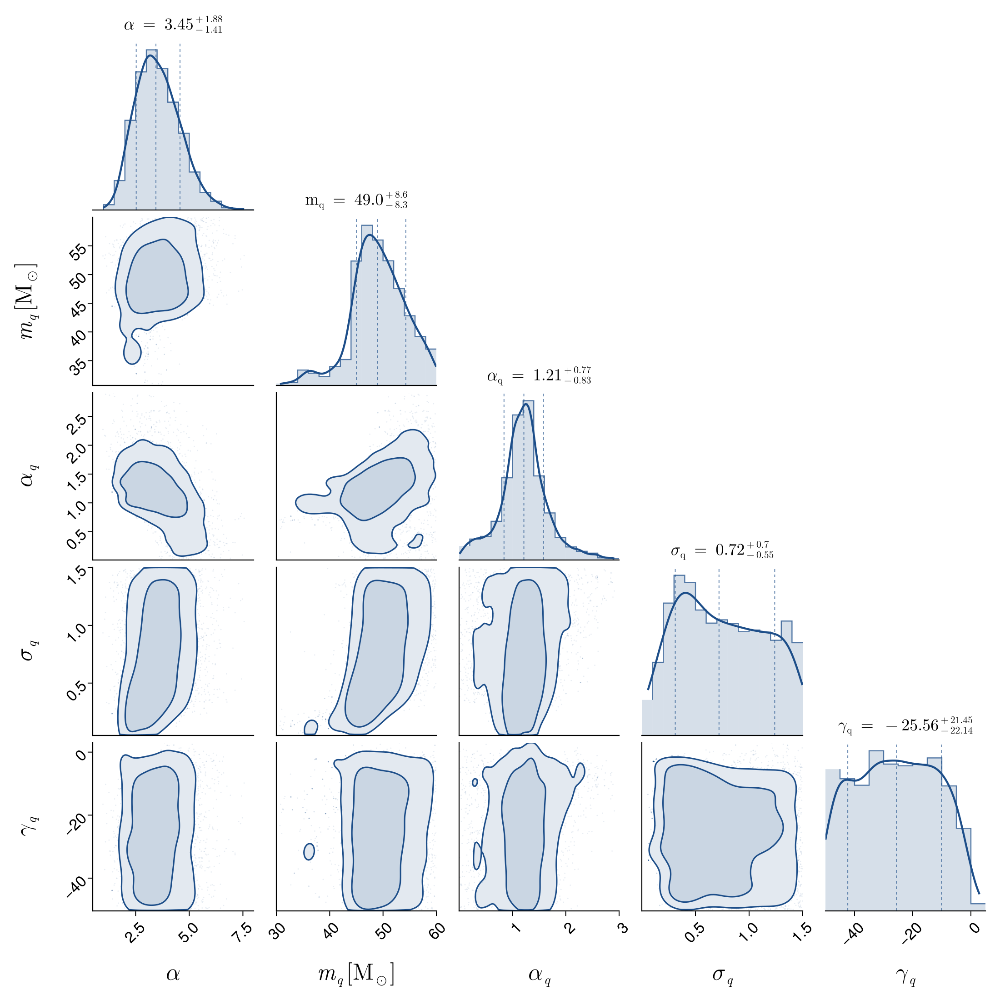

CairoMakie.Screen{IMAGE}


In [8]:
using DataFrames
using PairPlots
using CairoMakie
using LaTeXStrings
using Statistics

alpha_samples   = vec(trace[:posterior][:alpha])
mu_samples      = vec(trace[:posterior][:mu])
alpha_q_samples = vec(trace[:posterior][:alpha_q])
sigma_q_samples = vec(trace[:posterior][:sigma_q])
gamma_q_samples = vec(trace[:posterior][:gamma_q])

df = DataFrame(
    alpha   = alpha_samples,
    m_q     = mu_samples,
    alpha_q = alpha_q_samples,
    sigma_q = sigma_q_samples,
    gamma_q = gamma_q_samples,
)

labels = Dict(
    :alpha   => L"\alpha",
    :m_q     => L"m_q\,[\mathrm{M}_\odot]",
    :alpha_q => L"\alpha_q",
    :sigma_q => L"\sigma_q",
    :gamma_q => L"\gamma_q",
)

function parameter_title(label, samples; digits=2)
    lower, median, upper = quantile(samples, [0.05, 0.50, 0.95])

    median_text = round(median; digits=digits)
    lower_text  = round(median - lower; digits=digits)
    upper_text  = round(upper - median; digits=digits)

    return LaTeXString(
        label *
        " = $(median_text)" *
        "^{+$(upper_text)}" *
        "_{-$(lower_text)}"
    )
end

diagonal_titles = [
    parameter_title("\\alpha",   alpha_samples),
    parameter_title("m_q",       mu_samples; digits=1),
    parameter_title("\\alpha_q", alpha_q_samples),
    parameter_title("\\sigma_q", sigma_q_samples),
    parameter_title("\\gamma_q", gamma_q_samples),
]

posterior_color = colorant"#1D4E89"

fig = Figure(
    size=(1100, 1100),
    backgroundcolor=:white,
)

corner_grid = GridLayout(fig[1, 1])

PairPlots.pairplot(
    corner_grid,

    PairPlots.Series(
        df;
        color=posterior_color,
    ) => (
        PairPlots.Scatter(
            filtersigma=2,
            color=(posterior_color, 0.10),
            markersize=2,
        ),

        PairPlots.Contourf(
            sigmas=[1, 2],
            bandwidth=1.1,
            alpha=0.35,
        ),

        PairPlots.Contour(
            sigmas=[1, 2],
            bandwidth=1.1,
            color=posterior_color,
            linewidth=1.6,
        ),

        PairPlots.MarginHist(
            color=(posterior_color, 0.18),
        ),

        PairPlots.MarginStepHist(
            color=(posterior_color, 0.75),
            linewidth=1.2,
        ),

        PairPlots.MarginDensity(
            color=posterior_color,
            linewidth=2.2,
        ),

        PairPlots.MarginQuantileLines(
            color=(posterior_color, 0.65),
            linewidth=1.0,
        ),
    );

    labels=labels,

    bodyaxis=(
        xlabelsize=25,
        ylabelsize=25,
        xticklabelsize=17,
        yticklabelsize=17,
        xgridvisible=false,
        ygridvisible=false,
        topspinevisible=false,
        rightspinevisible=false,
        spinewidth=1.1,
    ),

    diagaxis=(
        xlabelsize=25,
        xticklabelsize=17,
        titlesize=18,
        titlegap=8,
        xgridvisible=false,
        ygridvisible=false,
        topspinevisible=false,
        rightspinevisible=false,
        leftspinevisible=false,
        yticksvisible=false,
        yticklabelsvisible=false,
        spinewidth=1.1,
    ),
)

for i in 1:ncol(df)
    diagonal_axes = filter(
        object -> object isa Axis,
        contents(corner_grid[i, i]),
    )

    if !isempty(diagonal_axes)
        diagonal_axes[1].title[] = diagonal_titles[i]
    end
end

rowgap!(corner_grid, 8)
colgap!(corner_grid, 25)

if plot_save
    save(
        joinpath(outdir, "Fig4_corner_compact.pdf"),
        fig;
        px_per_unit=3,
    )
end

display(fig)

# Fig 5

┌ Info: Using the PixelPop array without transposition.
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X23sdnNjb2RlLXJlbW90ZQ==.jl:112
┌ Info: Normalized PixelPop integral = 1.0
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X23sdnNjb2RlLXJlbW90ZQ==.jl:226
┌ Info: Normalized this-work median integral = 1.0
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X23sdnNjb2RlLXJlbW90ZQ==.jl:466
┌ Info: The normalized PixelPop median lies within the pointwise 90% credible interval from this work in 94.6% of the common ordered m1-m2 pixels.
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X23sdnNjb2RlLXJlbW90ZQ==.jl:551
┌ Info: Data range = [-1.621875986441156, 1.2661516011847134]; displayed symmetric range = [-1.621875986441156, 1.621875986441156]
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebo

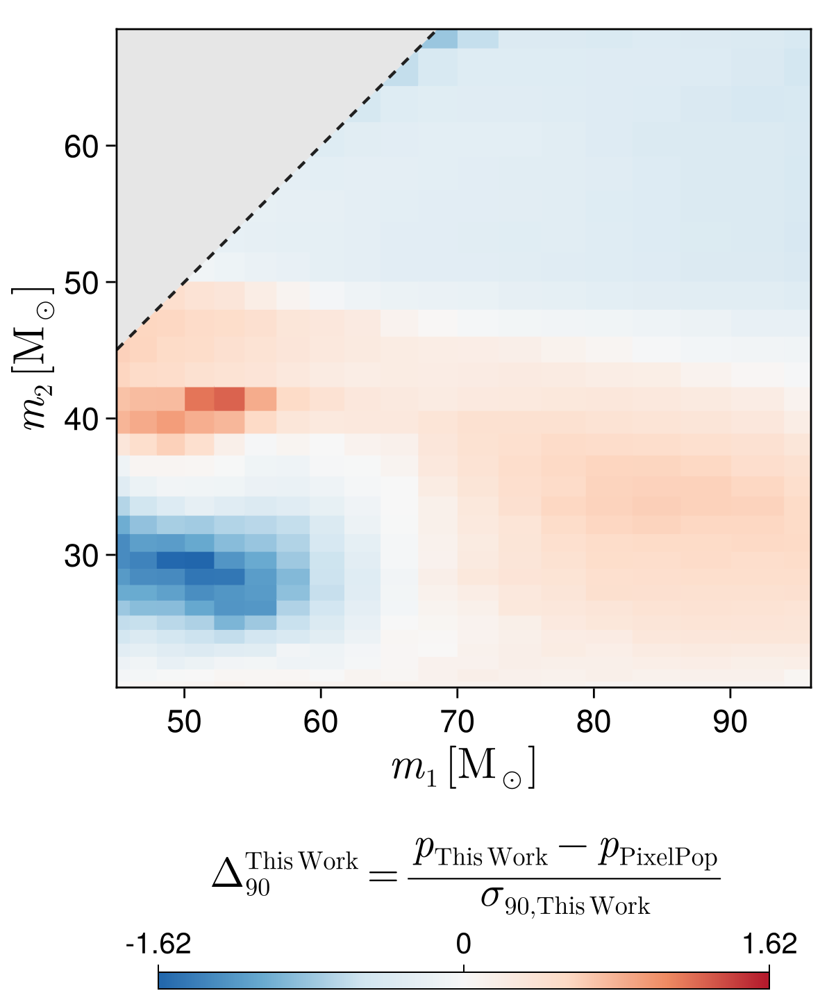

Figure saved to: /mnt/home/sroy1/Mass_Ordering/figures/Fig5_pixelpop_normalized_distribution_ours_uncertainty.pdf


In [9]:
using CairoMakie
using Colors
using HDF5
using LaTeXStrings
using Printf
using ProgressLogging
using Random
using Statistics
using StatsBase

z_compare = 0.2

m1_plot_min = 45.0
m1_plot_max = 100.0

m2_plot_min = 20.0
m2_plot_max = 70.0

number_comparison_draws = draws

pixelpop_path = joinpath(
    @__DIR__,
    "pixelpop_joint_m1_m2_rate_summary.h5"
)

isfile(pixelpop_path) ||
    error(
        "PixelPop file not found:\n$(abspath(pixelpop_path))"
    )

@isdefined(highmass_model_from_draw) ||
    error(
        "Run the Fig. 2 cell first so that " *
        "highmass_model_from_draw is defined."
    )

pixelpop_raw = h5open(pixelpop_path, "r") do file
    (
        m1_centers = Float64.(
            read(file["mass_1_centers"])
        ),

        m2_centers = Float64.(
            read(file["mass_2_centers"])
        ),

        m1_edges = Float64.(
            read(file["mass_1_edges"])
        ),

        m2_edges = Float64.(
            read(file["mass_2_edges"])
        ),

        median = Float64.(
            read(file["median_rate"])
        )
    )
end

length(pixelpop_raw.m1_edges) ==
    length(pixelpop_raw.m1_centers) + 1 ||
    error(
        "The PixelPop m1 edges are inconsistent with " *
        "the m1 centers."
    )

length(pixelpop_raw.m2_edges) ==
    length(pixelpop_raw.m2_centers) + 1 ||
    error(
        "The PixelPop m2 edges are inconsistent with " *
        "the m2 centers."
    )

ordered_mask_full = [
    m2 <= m1
    for m1 in pixelpop_raw.m1_centers,
        m2 in pixelpop_raw.m2_centers
]

raw_valid = (
    isfinite.(pixelpop_raw.median) .&
    (pixelpop_raw.median .> 0.0)
)

size(raw_valid) == size(ordered_mask_full) ||
    error(
        "The PixelPop rate array has shape " *
        "$(size(raw_valid)), while the expected grid has " *
        "shape $(size(ordered_mask_full))."
    )

score_without_transpose = count(
    raw_valid .&
    ordered_mask_full
)

score_with_transpose = count(
    permutedims(raw_valid) .&
    ordered_mask_full
)

transpose_pixelpop =
    score_with_transpose > score_without_transpose

if transpose_pixelpop
    @info(
        "Transposing the PixelPop array to obtain the " *
        "ordered m1-m2 plane."
    )
else
    @info(
        "Using the PixelPop array without transposition."
    )
end

pixelpop_median_full = transpose_pixelpop ?
    permutedims(pixelpop_raw.median) :
    copy(pixelpop_raw.median)

m1_indices = findall(
    mass ->
        m1_plot_min <= mass <= m1_plot_max,
    pixelpop_raw.m1_centers
)

m2_indices = findall(
    mass ->
        m2_plot_min <= mass <= m2_plot_max,
    pixelpop_raw.m2_centers
)

isempty(m1_indices) &&
    error(
        "No PixelPop m1 grid points are inside the requested range."
    )

isempty(m2_indices) &&
    error(
        "No PixelPop m2 grid points are inside the requested range."
    )

m1_comparison = pixelpop_raw.m1_centers[
    m1_indices
]

m2_comparison = pixelpop_raw.m2_centers[
    m2_indices
]

pixelpop_median = pixelpop_median_full[
    m1_indices,
    m2_indices
]

number_m1 = length(m1_comparison)
number_m2 = length(m2_comparison)

ordered_mask = [
    m2 <= m1
    for m1 in m1_comparison,
        m2 in m2_comparison
]

m1_bin_widths = diff(
    pixelpop_raw.m1_edges
)[m1_indices]

m2_bin_widths = diff(
    pixelpop_raw.m2_edges
)[m2_indices]

cell_areas = [
    m1_bin_widths[i] * m2_bin_widths[j]
    for i in eachindex(m1_comparison),
        j in eachindex(m2_comparison)
]

mass_jacobian = [
    m1 * m2
    for m1 in m1_comparison,
        m2 in m2_comparison
]

pixelpop_median ./= mass_jacobian

pixelpop_valid = (
    ordered_mask .&
    isfinite.(pixelpop_median) .&
    (pixelpop_median .> 0.0)
)

any(pixelpop_valid) ||
    error(
        "No valid PixelPop pixels were found in the " *
        "comparison region."
    )

pixelpop_normalization = sum(
    pixelpop_median[pixelpop_valid] .*
    cell_areas[pixelpop_valid]
)

isfinite(pixelpop_normalization) &&
    pixelpop_normalization > 0.0 ||
    error(
        "Invalid PixelPop normalization."
    )

pixelpop_distribution = fill(
    NaN,
    number_m1,
    number_m2
)

pixelpop_distribution[pixelpop_valid] .= (
    pixelpop_median[pixelpop_valid] ./
    pixelpop_normalization
)

pixelpop_integral = sum(
    pixelpop_distribution[pixelpop_valid] .*
    cell_areas[pixelpop_valid]
)

@info(
    "Normalized PixelPop integral = " *
    "$(round(pixelpop_integral, digits=6))"
)

posterior = trace.posterior

chain_indices = collect(
    span(
        dims(
            posterior,
            :chain
        )
    )
)

draw_indices = collect(
    span(
        dims(
            posterior,
            :draw
        )
    )
)

all_posterior_pairs = [
    (
        chain_index,
        draw_index
    )
    for chain_index in chain_indices
    for draw_index in draw_indices
]

number_to_use = min(
    number_comparison_draws,
    length(all_posterior_pairs)
)

comparison_rng = MersenneTwister(52025)

selected_pairs = sample(
    comparison_rng,
    all_posterior_pairs,
    number_to_use;
    replace = false
)

this_work_distribution_draws = fill(
    NaN,
    number_m1,
    number_m2,
    number_to_use
)

@progress for sample_index in eachindex(selected_pairs)

    chain_index, draw_index =
        selected_pairs[sample_index]

    log_population, _ =
        highmass_model_from_draw(
            trace,
            draw_index,
            chain_index
        )

    current_log_density = fill(
        NaN,
        number_m1,
        number_m2
    )

    for i in eachindex(m1_comparison)
        m1 = m1_comparison[i]

        for j in eachindex(m2_comparison)

            pixelpop_valid[i, j] || continue

            m2 = m2_comparison[j]
            q = m2 / m1

            current_log_density[i, j] =
                log_population(
                    m1,
                    q,
                    z_compare
                ) -
                log(m1)
        end
    end

    current_valid = (
        pixelpop_valid .&
        isfinite.(current_log_density)
    )

    any(current_valid) || continue

    maximum_log_density = maximum(
        current_log_density[current_valid]
    )

    scaled_density = fill(
        NaN,
        number_m1,
        number_m2
    )

    scaled_density[current_valid] .= exp.(
        current_log_density[current_valid] .-
        maximum_log_density
    )

    current_normalization = sum(
        scaled_density[current_valid] .*
        cell_areas[current_valid]
    )

    if (
        isfinite(current_normalization) &&
        current_normalization > 0.0
    )
        current_distribution = view(
            this_work_distribution_draws,
            :,
            :,
            sample_index
        )

        current_distribution[current_valid] .= (
            scaled_density[current_valid] ./
            current_normalization
        )
    end
end

this_work_distribution_lower = fill(
    NaN,
    number_m1,
    number_m2
)

this_work_distribution = fill(
    NaN,
    number_m1,
    number_m2
)

this_work_distribution_upper = fill(
    NaN,
    number_m1,
    number_m2
)

for i in eachindex(m1_comparison)
    for j in eachindex(m2_comparison)

        pixelpop_valid[i, j] || continue

        values = collect(
            view(
                this_work_distribution_draws,
                i,
                j,
                :
            )
        )

        finite_values = values[
            isfinite.(values)
        ]

        isempty(finite_values) && continue

        credible_interval = quantile(
            finite_values,
            [0.05, 0.50, 0.95]
        )

        this_work_distribution_lower[i, j] =
            credible_interval[1]

        this_work_distribution[i, j] =
            credible_interval[2]

        this_work_distribution_upper[i, j] =
            credible_interval[3]
    end
end

this_work_summary_valid = (
    pixelpop_valid .&
    isfinite.(this_work_distribution_lower) .&
    isfinite.(this_work_distribution) .&
    isfinite.(this_work_distribution_upper) .&
    (this_work_distribution_lower .>= 0.0) .&
    (
        this_work_distribution .>=
        this_work_distribution_lower
    ) .&
    (
        this_work_distribution_upper .>=
        this_work_distribution
    ) .&
    (this_work_distribution .> 0.0)
)

any(this_work_summary_valid) ||
    error(
        "No valid normalized posterior summaries were obtained."
    )

this_work_summary_normalization = sum(
    this_work_distribution[this_work_summary_valid] .*
    cell_areas[this_work_summary_valid]
)

isfinite(this_work_summary_normalization) &&
    this_work_summary_normalization > 0.0 ||
    error(
        "Invalid normalization for the pointwise median " *
        "distribution from this work."
    )

this_work_distribution_lower[this_work_summary_valid] ./=
    this_work_summary_normalization

this_work_distribution[this_work_summary_valid] ./=
    this_work_summary_normalization

this_work_distribution_upper[this_work_summary_valid] ./=
    this_work_summary_normalization

this_work_integral = sum(
    this_work_distribution[this_work_summary_valid] .*
    cell_areas[this_work_summary_valid]
)

@info(
    "Normalized this-work median integral = " *
    "$(round(this_work_integral, digits=6))"
)

comparison_valid = (
    pixelpop_valid .&
    this_work_summary_valid .&
    isfinite.(pixelpop_distribution) .&
    (pixelpop_distribution .> 0.0)
)

any(comparison_valid) ||
    error(
        "No common valid pixels were found."
    )

distribution_difference = fill(
    NaN,
    number_m1,
    number_m2
)

distribution_difference[comparison_valid] .= (
    this_work_distribution[comparison_valid] .-
    pixelpop_distribution[comparison_valid]
)

this_work_distribution_uncertainty = fill(
    NaN,
    number_m1,
    number_m2
)

for i in eachindex(m1_comparison)
    for j in eachindex(m2_comparison)

        comparison_valid[i, j] || continue

        if distribution_difference[i, j] >= 0.0
            this_work_distribution_uncertainty[i, j] =
                this_work_distribution[i, j] -
                this_work_distribution_lower[i, j]
        else
            this_work_distribution_uncertainty[i, j] =
                this_work_distribution_upper[i, j] -
                this_work_distribution[i, j]
        end
    end
end

normalized_valid = (
    comparison_valid .&
    isfinite.(this_work_distribution_uncertainty) .&
    (this_work_distribution_uncertainty .> 0.0)
)

normalized_difference = fill(
    NaN,
    number_m1,
    number_m2
)

normalized_difference[normalized_valid] .= (
    distribution_difference[normalized_valid] ./
    this_work_distribution_uncertainty[normalized_valid]
)

any(normalized_valid) ||
    error(
        "No valid pixels are available for the normalized " *
        "distribution comparison."
    )

inside_this_work_90 = (
    normalized_valid .&
    (abs.(normalized_difference) .<= 1.0)
)

inside_percentage = (
    100.0 *
    count(inside_this_work_90) /
    count(normalized_valid)
)

@info(
    "The normalized PixelPop median lies within the " *
    "pointwise 90% credible interval from this work in " *
    "$(round(inside_percentage, digits=1))% of the common " *
    "ordered m1-m2 pixels."
)

finite_comparison_values = normalized_difference[
    isfinite.(normalized_difference)
]

isempty(finite_comparison_values) &&
    error(
        "No finite comparison values are available."
    )

data_minimum = minimum(
    finite_comparison_values
)

data_maximum = maximum(
    finite_comparison_values
)

comparison_limit = max(
    abs(data_minimum),
    abs(data_maximum)
)

comparison_limit > 0.0 ||
    error(
        "All normalized differences are zero."
    )

colorbar_tick_values = [
    -comparison_limit,
    0.0,
    comparison_limit
]

colorbar_tick_labels = [
    @sprintf("%.3g", -comparison_limit),
    "0",
    @sprintf("%.3g", comparison_limit)
]

@info(
    "Data range = [$data_minimum, $data_maximum]; " *
    "displayed symmetric range = " *
    "[-$comparison_limit, $comparison_limit]"
)

comparison_colormap = cgrad(
    [
        colorant"#2166AC",
        colorant"#67A9CF",
        colorant"#D1E5F0",
        colorant"#F7F7F7",
        colorant"#FDDBC7",
        colorant"#EF8A62",
        colorant"#B2182B"
    ]
)

background_color = colorant"#E6E6E6"
equal_mass_color = colorant"#202020"

plot_width = 500
plot_height = 500

fig5 = Figure(
    size = (620, 690),
    backgroundcolor = :white,
    figure_padding = (8, 18, 8, 8),
    fontsize = 22
)

ax = Axis(
    fig5[1, 1];

    width = plot_width,
    height = plot_height,

    limits = (
        minimum(m1_comparison),
        maximum(m1_comparison),
        minimum(m2_comparison),
        maximum(m2_comparison)
    ),

    aspect = DataAspect(),

    xlabel = L"m_1\,[\mathrm{M}_{\odot}]",
    ylabel = L"m_2\,[\mathrm{M}_{\odot}]",

    xlabelsize = 31,
    ylabelsize = 31,

    xticklabelsize = 23,
    yticklabelsize = 23,

    xgridvisible = false,
    ygridvisible = false,

    topspinevisible = true,
    rightspinevisible = true,
    spinewidth = 1.4,

    xtickwidth = 1.4,
    ytickwidth = 1.4,
    xticksize = 7,
    yticksize = 7,

    backgroundcolor = background_color
)

comparison_heatmap = heatmap!(
    ax,
    m1_comparison,
    m2_comparison,
    normalized_difference;

    colormap = comparison_colormap,

    colorrange = (
        -comparison_limit,
        comparison_limit
    )
)

x_minimum = minimum(m1_comparison)
y_maximum = maximum(m2_comparison)

if y_maximum > x_minimum
    poly!(
        ax,
        Point2f[
            Point2f(x_minimum, x_minimum),
            Point2f(x_minimum, y_maximum),
            Point2f(y_maximum, y_maximum)
        ];

        color = background_color,
        strokewidth = 0
    )
end

equal_mass_min = max(
    minimum(m1_comparison),
    minimum(m2_comparison)
)

equal_mass_max = min(
    maximum(m1_comparison),
    maximum(m2_comparison)
)

lines!(
    ax,
    [equal_mass_min, equal_mass_max],
    [equal_mass_min, equal_mass_max];

    color = equal_mass_color,
    linewidth = 2.2,
    linestyle = :dash
)

Colorbar(
    fig5[2, 1],
    comparison_heatmap;

    vertical = false,

    label = L"\Delta_{90}^{\mathrm{This\,Work}}=\frac{p_{\mathrm{This\,Work}}-p_{\mathrm{PixelPop}}}{\sigma_{90,\mathrm{This\,Work}}}",

    labelsize = 30,
    ticklabelsize = 21,

    ticks = (
        colorbar_tick_values,
        colorbar_tick_labels
    ),

    width = plot_width - 60
)

rowgap!(
    fig5.layout,
    12
)
resize_to_layout!(fig5)

display(fig5)

if plot_save
    mkpath(outdir)

    pdf_path = joinpath(
        outdir,
        "Fig5_pixelpop_normalized_distribution_ours_uncertainty.pdf"
    )

    save(
        pdf_path,
        fig5
    )

    println(
        "Figure saved to: ",
        abspath(pdf_path)
    )
end

# Load PE Samples for Fig 6 & 7

In [10]:
## Samples and Selection

## Set up paths
struct Paths
    gwtc_2_dir::String
    gwtc_3_dir::String
    evt_table_file::String
    O4a_dir::String
    O4b_dir::String
end

paths = Paths(
    "/mnt/home/ccalvk/ceph/GWTC-2.1", 
    "/mnt/home/ccalvk/ceph/GWTC-3", 
    "/mnt/home/ccalvk/ceph/gwosc-snapshots/snapshot-2023-11-04/GWTC/GWTC.json",
    "/mnt/home/sroy1/ceph/O4/O4a_final_final_PE/bbh_only",
    "/mnt/home/sroy1/ceph/O4/O4b_final_final_PE"
)

Paths("/mnt/home/ccalvk/ceph/GWTC-2.1", "/mnt/home/ccalvk/ceph/GWTC-3", "/mnt/home/ccalvk/ceph/gwosc-snapshots/snapshot-2023-11-04/GWTC/GWTC.json", "/mnt/home/sroy1/ceph/O4/O4a_final_final_PE/bbh_only", "/mnt/home/sroy1/ceph/O4/O4b_final_final_PE")

In [11]:
# O1 + O2 + O3
all_pe = load_pe(;
    gwtc_2_dir=paths.gwtc_2_dir,
    gwtc_3_dir=paths.gwtc_3_dir,
)

evt_table = load_event_table(paths.evt_table_file)
all_pe = join_pe_evt_tables(all_pe, evt_table)
all_pe = far_cut(all_pe)

# O4a
O4a_pe = load_pe_from_dir_O4(;
    dir=paths.O4a_dir,
    run=:O4a,
)

# O4b
O4b_pe = load_pe_from_dir_O4(;
    dir=paths.O4b_dir,
    run=:O4b,
)

# Compare O4a and O4b event names
o4a_names = Set(unique(O4a_pe.gwname))
o4b_names = Set(unique(O4b_pe.gwname))

@info "O4a unique events: $(length(o4a_names))"
@info "O4b unique events: $(length(o4b_names))"
@info "O4a intersection O4b: $(length(intersect(o4a_names, o4b_names)))"
@info "O4b-only events: $(length(setdiff(o4b_names, o4a_names)))"

println("O4b-only names:")
println(sort(collect(setdiff(o4b_names, o4a_names))))

# Print event counts before combining
@info "O1/O2/O3 events: $(length(unique(all_pe.gwname)))"
@info "O4a events: $(length(unique(O4a_pe.gwname)))"
@info "O4b events: $(length(unique(O4b_pe.gwname)))"

# Combine O1/O2/O3 + O4a + O4b
all_pe = vcat(
    all_pe,
    O4a_pe,
    O4b_pe;
    cols=:intersect,
)

┌ Info: Could not read IGWN-GWTC2p1-v2-GW190425_081805_PEDataRelease_mixed_nocosmo.h5
└ @ BumpCosmologyGWTC3 /mnt/home/sroy1/Mass_Ordering/src/load.jl:26
┌ Info: Using C00:NRSur7dq4 for GW230601_224134
└ @ BumpCosmologyGWTC3 /mnt/home/sroy1/Mass_Ordering/src/load.jl:88
┌ Info: Using C00:Mixed for GW230605_065343
└ @ BumpCosmologyGWTC3 /mnt/home/sroy1/Mass_Ordering/src/load.jl:88
Loading IGWN HDF5 Files   2%|▋                           |  ETA: 0:01:20┌ Info: Using C00:NRSur7dq4 for GW230606_004305
└ @ BumpCosmologyGWTC3 /mnt/home/sroy1/Mass_Ordering/src/load.jl:88
┌ Info: Using C00:NRSur7dq4 for GW230608_205047
└ @ BumpCosmologyGWTC3 /mnt/home/sroy1/Mass_Ordering/src/load.jl:88
Loading IGWN HDF5 Files   5%|█▎                          |  ETA: 0:01:08┌ Info: Using C00:NRSur7dq4 for GW230609_064958
└ @ BumpCosmologyGWTC3 /mnt/home/sroy1/Mass_Ordering/src/load.jl:88
Loading IGWN HDF5 Files   6%|█▋                          |  ETA: 0:01:02┌ Info: Using C00:Mixed for GW230624_113103
└ @ BumpCo

O4b-only names:
SubString{String}["GW240413_022019", "GW240414_054515", "GW240420_175625", "GW240426_031451", "GW240428_225440", "GW240501_033534", "GW240505_133552", "GW240507_041632", "GW240511_031507", "GW240512_024139", "GW240513_183302", "GW240514_121713", "GW240515_005301", "GW240519_012815", "GW240520_213616", "GW240525_031210", "GW240526_093944", "GW240527_183429", "GW240527_230910", "GW240530_012417", "GW240531_040326", "GW240531_075248", "GW240601_061200", "GW240601_231004", "GW240612_081540", "GW240615_113620", "GW240615_160735", "GW240618_071627", "GW240621_195059", "GW240621_200935", "GW240621_214041", "GW240622_004008", "GW240627_131622", "GW240629_145256", "GW240630_101703", "GW240703_191355", "GW240705_053215", "GW240716_034900", "GW240824_205609", "GW240825_055146", "GW240830_211120", "GW240902_143306", "GW240907_153833", "GW240908_082628", "GW240908_125134", "GW240910_103535", "GW240915_001357", "GW240915_105151", "GW240916_184352", "GW240919_061559", "GW240920_073424

┌ Info: O1/O2/O3 events: 72
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X26sdnNjb2RlLXJlbW90ZQ==.jl:36
┌ Info: O4a events: 85
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X26sdnNjb2RlLXJlbW90ZQ==.jl:37
┌ Info: O4b events: 103
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X26sdnNjb2RlLXJlbW90ZQ==.jl:38


Row,spin_2y,dec,chirp_mass,redshift,theta_jn,ra,a_1,chi_p_2spin,viewing_angle,mass_1_source,cos_tilt_2,spin_2x,mass_2,cos_iota,chi_eff,mass_2_source,psi_J,log_likelihood,symmetric_mass_ratio,phi_12,spin_2z,phase,a_2,beta,spin_1z,chirp_mass_source,mass_ratio,comoving_distance,total_mass,mass_1,total_mass_source,chi_p,tilt_1,phi_1,tilt_2,cos_tilt_1,iota,luminosity_distance,phi_2,cos_theta_jn,inverted_mass_ratio,spin_1y,phi_jl,psi,spin_1x,gwname
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,SubStrin…
1,0.0157482,-1.2029,30.9684,0.0968552,2.77079,1.28323,0.00150978,0.0142601,0.370807,37.7342,0.827167,0.000942395,30.7108,-0.931191,0.00928814,27.999,2.70339,320.05,0.244516,2.46959,0.0232219,3.78693,0.028074,0.00264939,-0.0010508,28.2338,0.742006,418.022,72.0998,41.3889,65.7332,0.0112211,2.3406,5.32462,0.596749,-0.695997,2.76846,458.427,1.51103,-0.932035,1.3477,-0.000887186,2.07373,1.12909,0.000623018,GW150914_095045
2,0.306186,-1.17447,31.6976,0.0858721,2.58701,1.12687,0.927965,0.804829,0.554584,36.8689,-0.708659,-0.277814,33.1735,-0.876785,0.0308062,30.5501,3.19656,324.407,0.247804,0.924199,-0.415259,1.61676,0.585979,0.294629,0.400422,29.1909,0.828614,371.601,73.2084,40.0349,67.419,0.837126,1.12463,1.38345,2.35839,0.431506,2.63993,403.445,2.30765,-0.850119,1.20683,0.822478,5.85641,2.20776,0.155915,GW150914_095045
3,-0.281979,-1.20404,29.1559,0.0984072,2.65664,2.28386,0.377052,0.480531,0.48495,33.7307,0.069959,0.336426,30.3349,-0.864843,-0.164482,27.6172,1.85062,324.894,0.247517,5.15309,0.0307853,3.82701,0.440048,0.136484,-0.324358,26.5438,0.818754,424.561,67.3849,37.05,61.3479,0.349319,2.60655,0.43251,1.50078,-0.860247,2.61563,466.256,5.5856,-0.884698,1.22137,0.0805821,0.184376,0.549502,0.174548,GW150914_095045
4,-0.0257892,-1.28148,29.4337,0.0788087,2.46328,1.66579,0.436312,0.678088,0.678313,31.681,-0.548917,-0.578377,33.4479,-0.670639,-0.148147,31.0044,2.87312,325.099,0.249971,0.599913,-0.380195,0.994084,0.692628,0.250073,0.0789466,27.2835,0.978645,341.613,67.6256,34.1777,62.6854,0.564844,1.38885,2.58624,2.15186,0.180941,2.30587,368.478,3.18615,-0.778632,1.02182,0.226246,0.569816,1.58707,-0.364621,GW150914_095045
5,-0.615255,-1.22545,28.3426,0.093687,2.78603,2.18355,0.53497,0.32345,0.355559,35.457,-0.27069,-0.298152,27.4948,-0.906833,-0.213818,25.1395,4.77553,322.9,0.242752,2.08325,-0.192245,2.68165,0.710205,0.16795,-0.229113,25.9147,0.709015,404.658,66.2736,38.7788,60.5965,0.483425,2.01338,2.17789,1.84491,-0.428273,2.7065,442.491,4.26114,-0.937452,1.41041,0.397043,2.83741,2.81668,-0.275784,GW150914_095045
6,0.0101604,-1.2815,30.2896,0.105684,2.71688,1.89592,0.482283,0.45148,0.424714,33.7674,0.803428,-0.00136464,32.456,-0.945471,-0.0667451,29.3538,2.48545,323.721,0.248778,3.39295,0.0138334,4.20109,0.017218,0.134265,-0.136791,27.3944,0.869293,455.154,69.7921,37.3361,63.1212,0.462477,1.85838,4.59454,0.637765,-0.283633,2.80984,503.16,1.70431,-0.911157,1.15036,-0.459269,5.40313,1.17959,-0.0543767,GW150914_095045
7,-0.0143139,-1.22618,30.8565,0.120825,2.83255,2.33255,0.118997,0.0917852,0.309042,34.8008,0.970927,0.000399219,32.2669,-0.948892,-0.0101696,28.7885,3.17053,319.882,0.247765,4.02482,0.0580812,5.17008,0.0598203,0.0282465,-0.0666291,27.5301,0.827237,518.446,71.2725,39.0056,63.5893,0.0985938,2.16509,0.715448,0.241722,-0.559925,2.8205,580.964,4.74027,-0.952625,1.20884,0.0646731,2.74057,1.51725,0.0744185,GW150914_095045
8,-0.00522301,-1.25144,29.8868,0.118836,3.04766,2.17208,0.171419,0.835042,0.0939295,32.0239,-0.372615,0.805206,32.907,-0.983395,-0.122761,29.4119,0.71106,325.143,0.249548,0.138759,-0.323322,4.3655,0.867711,0.235285,0.0614407,26.7124,0.918436,510.159,68.7365,35.8294,61.4357,0.730616,1.20422,6.13794,1.95262,

In [12]:
groups_all_pe = groupby(all_pe, :gwname)
pe = mass_cut(all_pe, thresh=0.5)
groups = groupby(pe, :gwname)

Row,spin_2y,dec,chirp_mass,redshift,theta_jn,ra,a_1,chi_p_2spin,viewing_angle,mass_1_source,cos_tilt_2,spin_2x,mass_2,cos_iota,chi_eff,mass_2_source,psi_J,log_likelihood,symmetric_mass_ratio,phi_12,spin_2z,phase,a_2,beta,spin_1z,chirp_mass_source,mass_ratio,comoving_distance,total_mass,mass_1,total_mass_source,chi_p,tilt_1,phi_1,tilt_2,cos_tilt_1,iota,luminosity_distance,phi_2,cos_theta_jn,inverted_mass_ratio,spin_1y,phi_jl,psi,spin_1x,gwname
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,SubStrin…
1,-0.361884,-0.454484,42.6978,0.34624,2.26706,4.93797,0.103945,0.34581,0.874534,54.0953,0.216273,-0.0483144,33.9831,-0.605213,0.0876596,25.2429,2.5159,49.0137,0.216937,1.60404,0.0808742,1.16425,0.373945,0.0517145,0.0908259,31.7164,0.466638,1402.47,106.808,72.8253,79.3382,0.15354,0.50786,2.97563,1.3528,0.873787,2.22083,1887.34,4.57967,-0.641354,2.14299,0.00835091,2.04499,0.915452,-0.0498549,GW170729_185629
2,0.429181,-1.02713,41.585,0.378877,2.39425,5.44432,0.226822,0.812392,0.747341,50.591,-0.474999,-0.563788,33.5773,-0.635545,-0.00543917,24.3512,2.64048,49.1407,0.219351,6.01335,-0.382465,1.53051,0.805191,0.164082,0.176036,30.1586,0.481334,1521.43,103.336,69.7588,74.9422,0.308559,0.682341,2.76076,2.06576,0.776098,2.25951,2097.04,2.49093,-0.733499,2.07756,0.0531652,0.916594,1.19879,-0.132789,GW170729_185629
3,0.21843,-1.24588,52.4074,0.490753,0.322369,5.75694,0.606857,0.286354,0.322369,49.7346,0.315441,-0.702198,49.2866,0.900796,0.359535,33.0615,2.94616,52.3902,0.239862,4.17765,0.244452,3.50304,0.774952,0.131769,0.436038,35.155,0.664759,1912.32,123.429,74.142,82.7961,0.461514,0.769127,4.94555,1.24987,0.718518,0.449196,2849.61,2.84001,0.948487,1.50431,-0.410653,4.38907,1.27908,0.0975223,GW170729_185629
4,-0.246884,-0.827363,53.7504,0.557889,0.897795,5.27817,0.850588,0.371402,0.897795,48.2798,-0.771508,0.13587,51.0634,0.524103,0.337037,32.7773,3.92845,47.9079,0.240855,5.94667,-0.341726,2.89333,0.442932,0.139173,0.797851,34.5021,0.678903,2134.66,126.278,75.2146,81.0571,0.294844,0.353982,5.55201,2.452,0.938,1.01913,3324.18,5.21549,0.623336,1.47297,-0.196881,5.24942,2.44108,0.219478,GW170729_185629
5,0.571079,-1.00337,46.4262,0.404833,2.32303,5.56831,0.640768,0.595299,0.818561,56.2295,0.0665277,0.142286,37.0278,-0.468697,0.205944,26.3575,4.59594,44.8349,0.217293,5.50086,0.039241,3.32303,0.589844,0.33182,0.284086,33.0475,0.468748,1614.43,116.021,78.993,82.5869,0.57435,1.11146,2.10894,1.50422,0.443353,2.05861,2267.1,1.32661,-0.683272,2.13334,0.493173,2.30044,2.77677,-0.294378,GW170729_185629
6,-0.109811,-1.20446,53.0382,0.337366,1.26225,5.66588,0.503433,0.162719,1.26225,61.2832,-0.386603,-0.102857,46.0386,0.235986,0.288109,34.4248,3.29396,52.2505,0.230312,5.49487,-0.0630723,3.20538,0.163145,0.0706672,0.485379,39.6587,0.561733,1369.73,127.997,81.9581,95.7081,0.133613,0.268623,4.748,1.96774,0.964137,1.33256,1831.14,3.95968,0.303672,1.7802,-0.133528,4.61096,1.71581,0.00475661,GW170729_185629
7,0.0507226,-0.21326,44.3086,0.175377,1.75826,4.75797,0.134807,0.0651156,1.38333,60.4755,-0.612689,-0.0156933,37.2031,-0.157165,0.0667323,31.6521,4.32484,44.1651,0.225529,0.755459,-0.0411611,2.98524,0.067181,0.0331058,0.123202,37.6974,0.523386,742.425,108.285,71.0815,92.1276,0.054718,0.417963,1.11539,2.23025,0.913918,1.72862,872.39,1.87085,-0.186366,1.91064,0.0491413,1.10799,2.76901,0.0240665,GW170729_185629
8,-0.148282,-0.946543,49.4801,0.368082,2.2175,5.31692,0.282569,0.160404,0.924093,63.0017,0.313984,0.17902,38.6721,-0.669028,0.199877,28.2674,2.95949,46.5651,0.213792,0.170117,0.0768752,2.7397,0.244838,0.0914683,0.255064,36.1675,0.448676,1482.33,124.864,86.1915,91.2691,0.121603,0.44488,5.42131,1.25141,0.902662,2.3037,2027.16,5.59143,-0.602558,2.

# Fig 6 & 7

┌ Info: Events after mass cut: 60
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X32sdnNjb2RlLXJlbW90ZQ==.jl:21
┌ Info: Page 1: plotting events 1-30 in a 5 × 6 grid
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X32sdnNjb2RlLXJlbW90ZQ==.jl:207
┌ Info: Page 1 population-reweighting Neff: minimum = 19.6, median = 2234.4, maximum = 83693.0
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X32sdnNjb2RlLXJlbW90ZQ==.jl:485
┌ Info: Page 2: plotting events 31-60 in a 5 × 6 grid
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X32sdnNjb2RlLXJlbW90ZQ==.jl:207
┌ Info: Page 2 population-reweighting Neff: minimum = 347.8, median = 1667.5, maximum = 8913.3
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X32sdnNjb2RlLXJlbW90ZQ==.jl:485


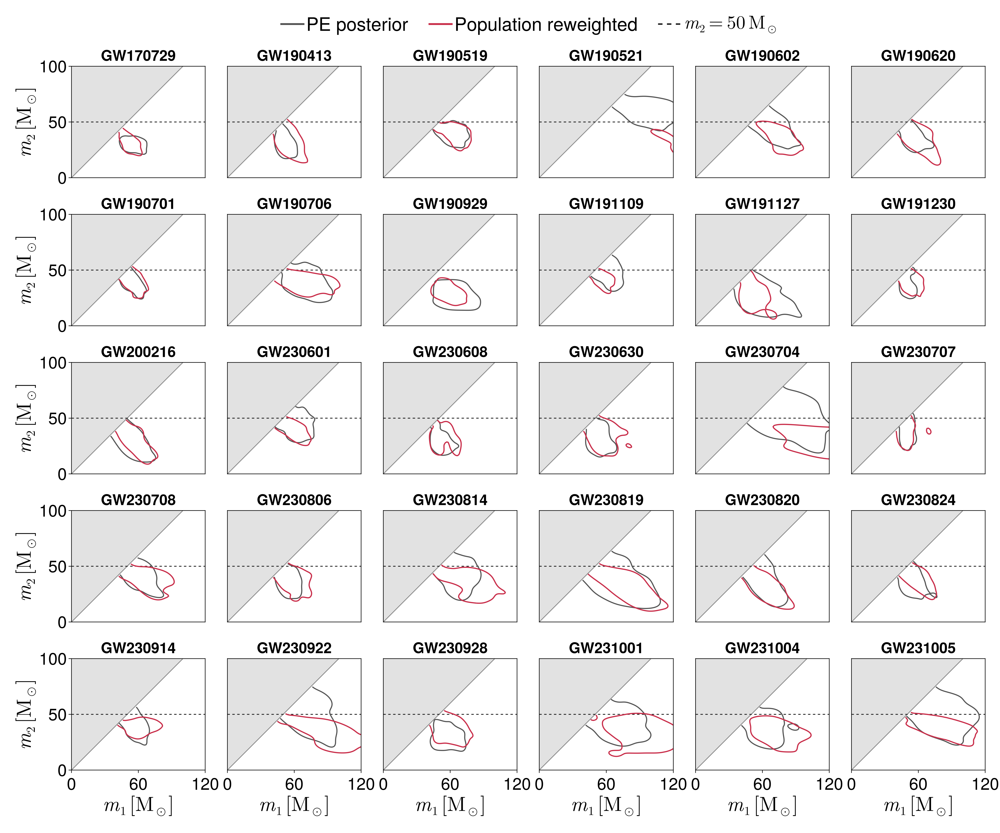

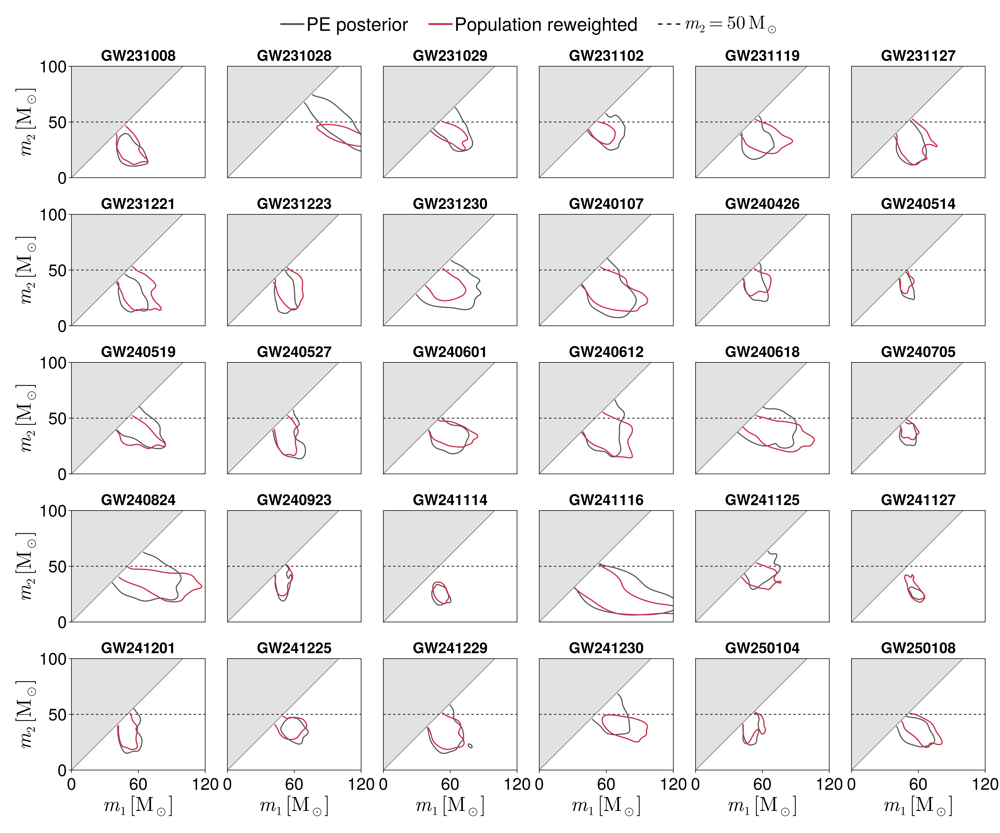

CairoMakie.Screen{IMAGE}


In [13]:
using CairoMakie
using Colors
using GaussianKDEs
using LaTeXStrings
using ProgressLogging
using Random
using Statistics
using StatsBase
using StatsFuns

pe = mass_cut(
    all_pe;
    m1_min = 45.0,
    m2_min = 3.0,
    m2_max = 70.0,
    thresh = 0.5
)

groups = groupby(pe, :gwname)

@info "Events after mass cut: $(length(groups))"

function median_population_model(
    trace;
    fixed_mtr = nothing
)
    p = trace.posterior

    alphatr = median(vec(p.alphatr))
    alpha   = median(vec(p.alpha))
    mu      = median(vec(p.mu))
    alpha_q = median(vec(p.alpha_q))
    sigma_q = median(vec(p.sigma_q))
    gamma_q = median(vec(p.gamma_q))
    lambda  = median(vec(p.lambda))
    zp      = median(vec(p.zp))
    kappa   = median(vec(p.kappa))

    mtr = if isnothing(fixed_mtr)
        median(vec(p.mtr))
    else
        Float64(fixed_mtr)
    end

    return BumpCosmologyGWTC3.make_log_dNdm1dqdVdt(
        alphatr,
        alpha,
        mtr,
        mu,
        alpha_q,
        sigma_q,
        gamma_q,
        lambda,
        zp,
        kappa;
        mlow = 5.0,
        mhigh = 300.0,
        m2_min = 3.0
    )
end

function log_volume_factor(redshifts)
    z = Float64.(redshifts)

    dh = BumpCosmologyGWTC3.dH(
        BumpCosmologyGWTC3.h_lvk
    )

    dc = BumpCosmologyGWTC3.dc_over_dh(
        z,
        BumpCosmologyGWTC3.Ω_M_lvk
    )

    dvdz = BumpCosmologyGWTC3.dvdz_over_vh(
        z,
        BumpCosmologyGWTC3.Ω_M_lvk,
        dc
    )

    return @.(
        3 * log(dh) +
        log(dvdz) -
        log1p(z)
    )
end

function population_weights(
    evt,
    log_population
)
    m1 = Float64.(evt[!, :mass_1_source])
    q  = Float64.(evt[!, :mass_ratio])
    z  = Float64.(evt[!, :redshift])

    log_pe_prior = Float64.(
        li_nocosmo_prior_logwt_m1qz(evt)
    )

    log_volume = log_volume_factor(z)

    log_weights = [
        log_population(m1[i], q[i], z[i]) +
        log_volume[i] -
        log_pe_prior[i]
        for i in eachindex(m1)
    ]

    finite = isfinite.(log_weights)

    any(finite) ||
        error("No finite population weights were obtained.")

    weights = zeros(Float64, length(log_weights))

    weights[finite] .= exp.(
        log_weights[finite] .-
        logsumexp(log_weights[finite])
    )

    weights ./= sum(weights)

    neff = 1 / sum(abs2, weights)

    return weights, neff
end

function credible_contour_90(
    m1,
    m2;
    mlow = 0.0,
    m1high = 120.0,
    m2high = 100.0,
    ngrid = 100
)
    m1 = Float64.(m1)
    m2 = Float64.(m2)

    kde_points = vcat(m1', m2')
    kde = KDE(kde_points)

    sample_density = [
        pdf(kde, [m1[i], m2[i]]) +
        pdf(kde, [m2[i], m1[i]])
        for i in eachindex(m1)
    ]

    level_90 = quantile(sample_density, 0.10)

    xgrid = range(
        mlow,
        m1high;
        length = ngrid
    )

    ygrid = range(
        mlow,
        m2high;
        length = ngrid
    )

    density_grid = [
        x >= y ?
        pdf(kde, [x, y]) + pdf(kde, [y, x]) :
        NaN
        for x in xgrid, y in ygrid
    ]

    return xgrid, ygrid, density_grid, level_90
end

function short_event_name(name)
    return first(split(string(name), "_"))
end

function plot_event_page_reweighted(
    groups,
    log_population;
    start_index = 1,
    page_number = 1,
    nrows = 5,
    ncols = 6,
    mlow = 0.0,
    m1high = 120.0,
    m2high = 100.0,
    horizontal_line = 50.0,
    ndraw_original = 100,
    ndraw_reweighted = 100,
    ngrid = 100,
    rng = Random.Xoshiro(1234)
)
    maximum_events = nrows * ncols

    start_index <= length(groups) ||
        error(
            "start_index=$start_index exceeds the number " *
            "of available events ($(length(groups)))."
        )

    last_index = min(
        start_index + maximum_events - 1,
        length(groups)
    )

    event_indices = collect(start_index:last_index)
    nevents = length(event_indices)

    @info(
        "Page $page_number: plotting events " *
        "$start_index-$last_index in a " *
        "$(nrows) × $(ncols) grid"
    )

    pe_color         = colorant"#555555"
    population_color = colorant"#C92F4B"
    equal_mass_color = colorant"#8C8C8C"
    m2_line_color    = colorant"#202020"
    excluded_color   = colorant"#E2E2E2"

    neffs = fill(NaN, nevents)

    f = Figure(
        size = (2700, 2250),
        backgroundcolor = :white,
        figure_padding = (40, 40, 30, 30)
    )

    legend_elements = [
        LineElement(
            color = pe_color,
            linewidth = 5
        ),
        LineElement(
            color = population_color,
            linewidth = 5
        ),
        LineElement(
            color = m2_line_color,
            linewidth = 4,
            linestyle = :dash
        )
    ]

    Legend(
        f[1, 1],
        legend_elements,
        [
            "PE posterior",
            "Population reweighted",
            L"m_2 = 50\,\mathrm{M}_\odot"
        ];
        orientation = :horizontal,
        framevisible = false,
        labelsize = 50,
        patchsize = (65, 28),
        colgap = 55,
        rowgap = 8,
        tellwidth = false,
        tellheight = true
    )

    event_grid = GridLayout(f[2, 1])

    axes = Matrix{Axis}(undef, nrows, ncols)

    for row in 1:nrows
        for col in 1:ncols
            ax = Axis(
                event_grid[row, col];

                limits = (
                    mlow,
                    m1high,
                    mlow,
                    m2high
                ),

                aspect = DataAspect(),

                xticks = (
                    [0.0, 60.0, 120.0],
                    ["0", "60", "120"]
                ),

                yticks = (
                    [0.0, 50.0, 100.0],
                    ["0", "50", "100"]
                ),

                xlabel = row == nrows ?
                    L"m_1\,[\mathrm{M}_\odot]" : "",

                ylabel = col == 1 ?
                    L"m_2\,[\mathrm{M}_\odot]" : "",

                xlabelsize = 55,
                ylabelsize = 55,

                titlesize = 40,
                titlefont = :bold,
                titlegap = 6,

                xticklabelsize = 45,
                yticklabelsize = 45,

                xticksize = 7,
                yticksize = 7,
                xtickwidth = 1.6,
                ytickwidth = 1.6,

                xgridvisible = false,
                ygridvisible = false,

                topspinevisible = true,
                rightspinevisible = true,
                spinewidth = 1.6,

                backgroundcolor = :white
            )

            axes[row, col] = ax

            if row != nrows
                hidexdecorations!(
                    ax;
                    grid = false
                )
            end

            if col != 1
                hideydecorations!(
                    ax;
                    grid = false
                )
            end

            band!(
                ax,
                [mlow, m2high],
                [mlow, m2high],
                [m2high, m2high];
                color = excluded_color
            )

            lines!(
                ax,
                [mlow, m2high],
                [mlow, m2high];
                color = equal_mass_color,
                linewidth = 2.2
            )

            hlines!(
                ax,
                [horizontal_line];
                color = m2_line_color,
                linewidth = 2.2,
                linestyle = :dash
            )
        end
    end

    @progress for local_index in eachindex(event_indices)
        event_index = event_indices[local_index]

        row = div(local_index - 1, ncols) + 1
        col = mod(local_index - 1, ncols) + 1

        ax = axes[row, col]
        evt = groups[event_index]

        full_event_name = string(evt[1, :gwname])
        display_event_name = short_event_name(full_event_name)

        ax.title[] = display_event_name

        npe = nrow(evt)

        if npe < 2
            @warn(
                "Skipping $full_event_name because it has " *
                "fewer than two posterior samples"
            )
            continue
        end

        nkeep = min(ndraw_original, npe)

        original_inds = randperm(rng, npe)[1:nkeep]

        original_m1 = Float64.(
            evt[original_inds, :mass_1_source]
        )

        original_m2 = Float64.(
            evt[original_inds, :mass_2_source]
        )

        weights, neff = population_weights(
            evt,
            log_population
        )

        neffs[local_index] = neff

        nreweighted = min(ndraw_reweighted, npe)

        reweighted_inds = sample(
            rng,
            1:npe,
            Weights(weights),
            nreweighted;
            replace = true
        )

        reweighted_m1 = Float64.(
            evt[reweighted_inds, :mass_1_source]
        )

        reweighted_m2 = Float64.(
            evt[reweighted_inds, :mass_2_source]
        )

        x_original,
        y_original,
        density_original,
        level_original = credible_contour_90(
            original_m1,
            original_m2;
            mlow = mlow,
            m1high = m1high,
            m2high = m2high,
            ngrid = ngrid
        )

        x_reweighted,
        y_reweighted,
        density_reweighted,
        level_reweighted = credible_contour_90(
            reweighted_m1,
            reweighted_m2;
            mlow = mlow,
            m1high = m1high,
            m2high = m2high,
            ngrid = ngrid
        )

        contour!(
            ax,
            x_original,
            y_original,
            density_original;
            levels = [level_original],
            color = pe_color,
            linewidth = 3.0
        )

        contour!(
            ax,
            x_reweighted,
            y_reweighted,
            density_reweighted;
            levels = [level_reweighted],
            color = population_color,
            linewidth = 3.2
        )
    end

    if nevents < maximum_events
        for local_index in (nevents + 1):maximum_events
            row = div(local_index - 1, ncols) + 1
            col = mod(local_index - 1, ncols) + 1

            axes[row, col].scene.visible[] = false
        end
    end

    rowgap!(event_grid, 18)
    colgap!(event_grid, 60)

    rowgap!(f.layout, 12)

    finite_neffs = neffs[isfinite.(neffs)]

    if !isempty(finite_neffs)
        @info(
            "Page $page_number population-reweighting Neff: " *
            "minimum = $(round(minimum(finite_neffs), digits=1)), " *
            "median = $(round(median(finite_neffs), digits=1)), " *
            "maximum = $(round(maximum(finite_neffs), digits=1))"
        )
    end

    return f, neffs
end

log_population = median_population_model(
    trace;
    fixed_mtr = nothing
)

f_page1, population_neffs_page1 = plot_event_page_reweighted(
    groups,
    log_population;
    start_index = 1,
    page_number = 1,
    nrows = 5,
    ncols = 6,
    mlow = 0.0,
    m1high = 120.0,
    m2high = 100.0,
    horizontal_line = 50.0,
    ndraw_original = 100,
    ndraw_reweighted = 100,
    ngrid = 100,
    rng = Random.Xoshiro(1234)
)

f_page2, population_neffs_page2 = plot_event_page_reweighted(
    groups,
    log_population;
    start_index = 31,
    page_number = 2,
    nrows = 5,
    ncols = 6,
    mlow = 0.0,
    m1high = 120.0,
    m2high = 100.0,
    horizontal_line = 50.0,
    ndraw_original = 100,
    ndraw_reweighted = 100,
    ngrid = 100,
    rng = Random.Xoshiro(5678)
)

if plot_save
    save(
        joinpath(
            outdir,
            "Fig6_m1_m2_population_reweighted_page1.pdf"
        ),
        f_page1;
        px_per_unit = 2
    )

    save(
        joinpath(
            outdir,
            "Fig7_m1_m2_population_reweighted_page2.pdf"
        ),
        f_page2;
        px_per_unit = 2
    )
end

display(f_page1)
display(f_page2)

# pcut=0.1 and pcut=0.5, pcut=0.9 does not have neff>4Nobs for selection integral

┌ Info: p_cut = 0.1, Nobs = 107, minimum Neff_samps = 4.35, minimum Neff_sel = 1378.3, 4*Nobs = 428
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X34sdnNjb2RlLXJlbW90ZQ==.jl:27
┌ Info: p_cut = 0.5, Nobs = 60, minimum Neff_samps = 4.1, minimum Neff_sel = 385.9, 4*Nobs = 240
└ @ Main /mnt/home/sroy1/Mass_Ordering/scripts/jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X34sdnNjb2RlLXJlbW90ZQ==.jl:27


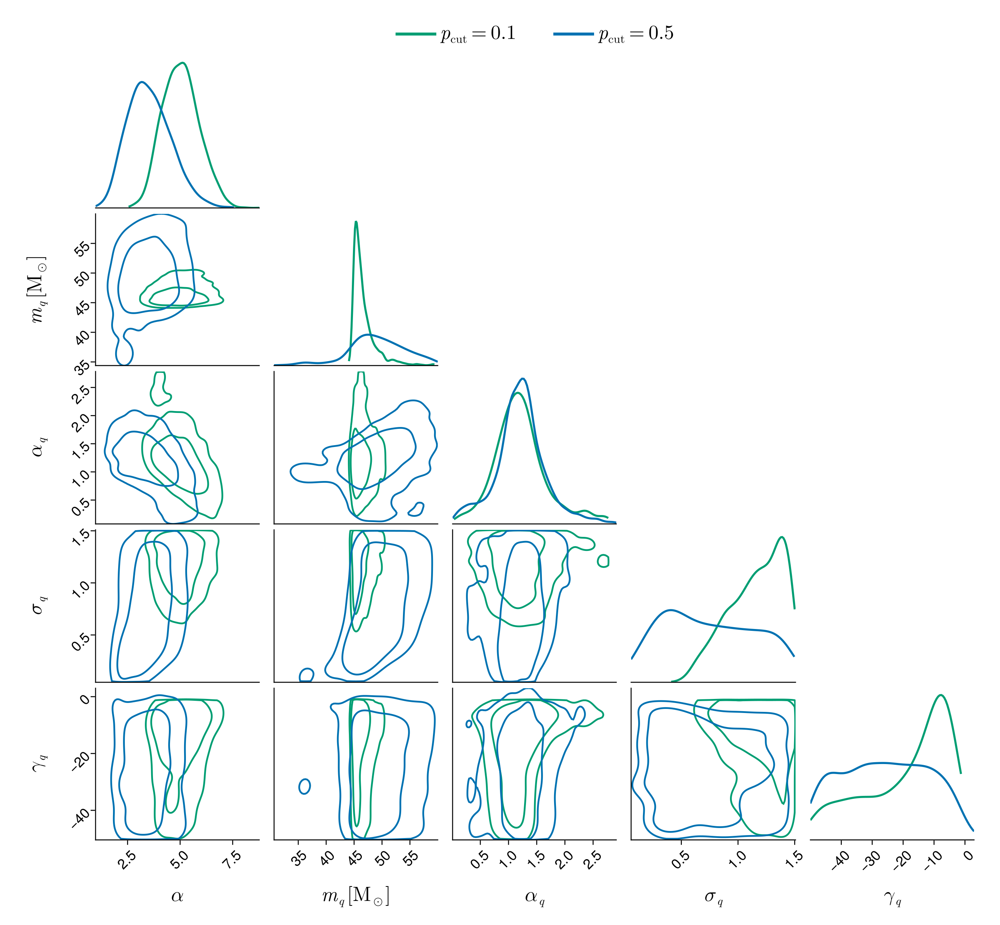

CairoMakie.Screen{IMAGE}


In [14]:
using CairoMakie
using Colors
using DataFrames
using LaTeXStrings
using PairPlots

trace_samples_0p1 = from_netcdf(
    joinpath(@__DIR__, "..", "data", "chains_0.1.nc")
)

trace_samples_0p5 = from_netcdf(
    joinpath(@__DIR__, "..", "data", "chains_0.5.nc")
)

function print_neff(trace, p_cut)
    ne_min = dropdims(
        minimum(
            trace.posterior.Neff_samps;
            dims = (:chain, :draw)
        );
        dims = (:chain, :draw)
    )

    ns_min = minimum(trace.posterior.Neff_sel)
    nobs = length(dims(trace.posterior, :event))

    @info(
        "p_cut = $p_cut, " *
        "Nobs = $nobs, " *
        "minimum Neff_samps = " *
        "$(round(minimum(ne_min), digits = 2)), " *
        "minimum Neff_sel = " *
        "$(round(ns_min, digits = 1)), " *
        "4*Nobs = $(4 * nobs)"
    )
end

print_neff(trace_samples_0p1, 0.1)
print_neff(trace_samples_0p5, 0.5)

function posterior_dataframe(trace)
    posterior = trace.posterior

    return DataFrame(
        alpha   = vec(posterior.alpha),
        m_q     = vec(posterior.mu),
        alpha_q = vec(posterior.alpha_q),
        sigma_q = vec(posterior.sigma_q),
        gamma_q = vec(posterior.gamma_q)
    )
end

df_0p1 = posterior_dataframe(trace_samples_0p1)
df_0p5 = posterior_dataframe(trace_samples_0p5)

parameter_labels = Dict(
    :alpha   => L"\alpha",
    :m_q     => L"m_q\,[\mathrm{M}_{\odot}]",
    :alpha_q => L"\alpha_q",
    :sigma_q => L"\sigma_q",
    :gamma_q => L"\gamma_q"
)

color_0p1 = colorant"#009E73"
color_0p5 = colorant"#0072B2"

layers_0p1 = (
    PairPlots.Contour(
        sigmas = [1, 2],
        bandwidth = 1.1,
        color = color_0p1,
        linewidth = 2.4
    ),
    PairPlots.MarginDensity(
        color = color_0p1,
        linewidth = 2.8
    )
)

layers_0p5 = (
    PairPlots.Contour(
        sigmas = [1, 2],
        bandwidth = 1.1,
        color = color_0p5,
        linewidth = 2.4
    ),
    PairPlots.MarginDensity(
        color = color_0p5,
        linewidth = 2.8
    )
)

fig = Figure(
    size = (1350, 1250),
    backgroundcolor = :white,
    figure_padding = (35, 35, 25, 25)
)

legend_elements = [
    LineElement(
        color = color_0p1,
        linewidth = 4
    ),
    LineElement(
        color = color_0p5,
        linewidth = 4
    )
]

Legend(
    fig[1, 1],
    legend_elements,
    [
        L"p_{\mathrm{cut}} = 0.1",
        L"p_{\mathrm{cut}} = 0.5"
    ];
    orientation = :horizontal,
    framevisible = false,
    labelsize = 27,
    patchsize = (55, 24),
    colgap = 50,
    tellwidth = false,
    tellheight = true
)

corner_grid = GridLayout(fig[2, 1])

PairPlots.pairplot(
    corner_grid,

    PairPlots.Series(
        df_0p1;
        color = color_0p1,
        strokecolor = color_0p1
    ) => layers_0p1,

    PairPlots.Series(
        df_0p5;
        color = color_0p5,
        strokecolor = color_0p5
    ) => layers_0p5;

    labels = parameter_labels,

    bodyaxis = (
        xlabelsize = 27,
        ylabelsize = 27,
        xticklabelsize = 19,
        yticklabelsize = 19,

        xgridvisible = false,
        ygridvisible = false,

        topspinevisible = false,
        rightspinevisible = false,
        spinewidth = 1.3,

        xtickwidth = 1.3,
        ytickwidth = 1.3,
        xticksize = 6,
        yticksize = 6
    ),

    diagaxis = (
        xlabelsize = 27,
        xticklabelsize = 19,

        xgridvisible = false,
        ygridvisible = false,

        topspinevisible = false,
        rightspinevisible = false,
        leftspinevisible = false,

        yticksvisible = false,
        yticklabelsvisible = false,

        spinewidth = 1.3,
        xtickwidth = 1.3,
        xticksize = 6
    )
)

rowgap!(corner_grid, 8)
colgap!(corner_grid, 20)
rowgap!(fig.layout, 8)

display(fig)